In [97]:
import os, xarray as xr, numpy as np, pandas as pd, dask, random, netCDF4
import cartopy.crs as ccrs, matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable

from datetime import datetime as dt, timedelta
import datetime, time

import importlib
import matplotlib.patches as mpatches
import gc
from matplotlib.gridspec import GridSpec
dask.config.set({"array.slicing.split_large_chunks": False})
import sys
sys.path.insert(1, '/home/data/lab_hardik/udf/')


import h5netcdf

In [98]:
import random

In [99]:
import composite_funcs
import grad_funcs
importlib.reload(composite_funcs)
from composite_funcs import *
from grad_funcs import *

[30. 60. 90.]
[10. 30. 50.]


In [100]:
# tst = xr.open_dataset('/home/data/lab_hardik/data/ERA5/climatology/t_3D/dly_clmtlgy_stdPlevs_prmnsn_temperature_1980_2022_wFeb.nc')
# tst.close()

importlib.reload(composite_funcs)
from composite_funcs import *

[30. 60. 90.]
[10. 30. 50.]


In [101]:
dir_csv = '/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/'
# files = [s for s in os.listdir(dir_csv) if 'Apr' in s]
# # files.sort(key = os.path.getctime)
# files

In [102]:
os.chdir(dir_csv)

In [103]:
import variables
from variables import *

In [104]:
dir_plots = '/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/'

In [105]:
def plot_samples(ds, save_str = ''):
#     global fig, ax
    # num_plots = 10 if df.shape[0]>=10 else df.shape[0]
    # num_plots = 10 if len(ds.date)>=10 else len(ds.date)

    # num_plots = int(np.ceil(len(ds.date)/2)*2)

    num_plots = len(ds.date)

    nrow = int(np.ceil(num_plots/2))

    fig, ax = plt.subplots(
        nrow,2, figsize=(16, nrow*4), sharey=True, subplot_kw={'projection': ccrs.PlateCarree()}
    )

    for i in range(num_plots):
        r = bicol_panel_rownum(i)
        c = bicol_panel_colnum(i)
        print('rowunm',r)
        print('colnum',c)

        dt_str = str(ds.date.dt.date[i].data)

        tot_flx = df.loc[df['date'] == dt_str, 'Net_Adv'].values[0].round()
        dse_anom_Lag1 = df.loc[df['date'] == dt_str, 'dse_anom_Lag1'].values[0].round()

        da_plt = ds[dse_var].isel(date = i)#.mean(['date'])#.compute()
        da_cont = ds[z_var].isel(date = i)#.mean(['date'])#.compute()
        da_u = (ds[u_var]).isel(date = i)#.mean(['date'])#.compute()
        da_v = (ds[v_var]).isel(date = i)#.mean(['date'])#.compute()
        # da_u = ds['adv_flx_x'].mean(['date']).compute()
        # da_v = ds['adv_flx_y'].mean(['date']).compute()

        print('calling inner_composite() on i = ', i)
        # vmin = np.nan; vmax=np.nan
        inner_plot_composite(
            da_plt = da_plt, da_cont = da_cont, da_u = da_u, da_v = da_v, xmin=0, xmax=120, ymin=10, ymax=65, 
            cont_divisions=20, coarsen_pts=8,
            t_type = 'dse_anom',scale_quiv= 70, 
            i = r, j = c, ax=ax[r,c], 
            title_str = 'dse_anom_Lag1 = {}, dse_flx = {}, date = {}'\
            .format(dse_anom_Lag1, tot_flx, dt_str)
            )
    plt.tight_layout()
    
    if save_str != '':
        plt.savefig(dir_plots + save_str)
        plt.close()
        

In [133]:
dat_dir = '/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/'

csvs_negbg = [
    'Apr_negbg_amplif_ql_xy_v2.csv', 
    'Apr_negbg_amplif_nlsat_yNL_v2.csv', 
#     'Apr_negbg2_amplif_full_xyNL_v2.csv', 
    'Apr_negbg1_amplif_full_xNL_v2.csv', 
    
    'Apr_negbg1_decay_ql_xy_z_v2.csv', 
#     'Apr_negbg1_decay_ql_xy_v2.csv', 
    'Apr_negbg_decay_full_yzNL_v2.csv', 
    
    'Apr_negbg2_decay_nlsat_xNL_v2.csv', 
#     'Apr_negbg2_decay_ql_xy_v2.csv', 
#     'Apr_negbg2_decay_nl_xyz_v2.csv'
]

# newly added
# 'Apr_negbg1_amplif_full_xNL_v2.csv', 'Apr_negbg1_decay_ql_xy_z_v2.csv'

# not used
# 'Apr_negbg_decay_ql_xy_z_v2.csv',
# 'Apr_negbg_decay_ql_xy_v2.csv', 
# 'Apr_negbg2_decay_nl_xyz_v2.csv'

files = csvs_negbg

files.sort(key = lambda s: (s.split('_')[1], s.split('_')[2], s.split('_')[3], s.split('_')[4]))
print(len(files))
files

6


['Apr_negbg_amplif_nlsat_yNL_v2.csv',
 'Apr_negbg_amplif_ql_xy_v2.csv',
 'Apr_negbg_decay_full_yzNL_v2.csv',
 'Apr_negbg1_amplif_full_xNL_v2.csv',
 'Apr_negbg1_decay_ql_xy_z_v2.csv',
 'Apr_negbg2_decay_nlsat_xNL_v2.csv']

In [106]:
files_negbg_addn = ['Apr_negbg1_decay_ql_xy_z_v2.csv', 'Apr_negbg1_amplif_full_xNL_v2.csv']

files = files_negbg_addn

## New plotting section

In [107]:
dir_data = '/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/data/'

In [110]:
i=0
df = pd.read_csv(dir_csv + files[i], parse_dates=['date'])
print(df.shape)
print(files[i])
df.columns

(12, 27)
Apr_negbg1_decay_ql_xy_z_v2.csv


Index(['date', '$u'$$\mathcal{S}'_x$', '$v'$$\mathcal{S}'_y$',
       '$w'$$\mathcal{S}'_z$', '$v'$$\mathcal{S}̅_y$', '$w'$$\mathcal{S}̅_z$',
       '${u̅}$$\mathcal{S}'_x$', 'T_main', 'NL_sum', 'x_contrib_NL',
       'y_contrib_NL', 'z_contrib_NL', 'Net_Adv', '$\mathcal{S}'_y$',
       'dse_anom', 'dse_anom_Lag1', '$u'$', '$v'$', '$w'$', '$\mathcal{S}'_x$',
       '$\mathcal{S}'_z$', '${u̅}$', '${v̅}$', '${w̅}$', '$\mathcal{S}̅_x$',
       '$\mathcal{S}̅_y$', '$\mathcal{S}̅_z$'],
      dtype='object')

In [111]:
dir_data

'/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/data/'

In [112]:
importlib.reload(grad_funcs)
from grad_funcs import *

importlib.reload(composite_funcs)
from composite_funcs import *


[30. 60. 90.]
[10. 30. 50.]


In [113]:
dir_plots

'/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/'

In [115]:
dat_dir

'/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/'

In [116]:
dir_data

'/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/data/'

In [117]:
os.getcwd()

'/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files'

In [118]:
dir_csv

'/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/'

In [121]:
tst.close()

In [123]:
for file in files:
    print(file)
    print("out of", pd.read_csv(dat_dir + file, parse_dates=['date']).shape[0], "nc files,")
    existing_nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')
    ]
    print(len(existing_nc_lst), 'files exist')


Apr_negbg1_decay_ql_xy_z_v2.csv
out of 12 nc files,
12 files exist
Apr_negbg1_amplif_full_xNL_v2.csv
out of 9 nc files,
9 files exist


In [124]:
file = files[1]
print(file)

Apr_negbg1_amplif_full_xNL_v2.csv


In [125]:
df = pd.read_csv(dir_csv + file, parse_dates=['date'])
print(df.shape)
two_day_averaging = True

if two_day_averaging == True:
    nc_lst = [s for s in os.listdir(dir_data) if 
              starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
             and s.endswith('_2Dave.nc')]
else:
    nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

print('len(nc_lst)', len(nc_lst))

if 'Net_Adv' not in df.columns:
    df['Net_Adv'] = df['adv_recon_2Dave'].copy()

os.chdir(dir_data)
def preprocess(ds):
    return ds.expand_dims('date')

ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
print('ds_brnch', ds_brnch.dims)

flux_dts = df.date.to_list()
print(len(flux_dts))


(9, 16)
len(nc_lst) 9
ds_brnch Frozen({'date': 9, 'latitude': 201, 'longitude': 481})
9


0 Apr_negbg_amplif_nlsat_yNL_v2.csv
(13, 27)
len(nc_lst) 13
ds_brnch Frozen({'date': 13, 'latitude': 201, 'longitude': 481})
13
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-4927.70626239)
Coordinates:
    quantile  float64 0.0
vmax =  <xarray.DataArray 'dse_anom' ()>
array(4028.6626199)
Coordinates:
    quantile  float64 1.0
num_levs =  21
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-4927.70626239)
Coordinates:
    quantile  float64 0.0
vmax =  <xarray.DataArray 'dse_anom' ()>
array(4028.6626199)
Coordinates:
    quantile  float64 1.0
num_levs =  21
rowunm 0
colnum 0
calling inner_composite() on i =  0
[########################################] | 100% Completed | 102.62 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-5616.08819527)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(8056.73306882)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.70 ms
[##################################

[########################################] | 100% Completed | 101.69 ms
[########################################] | 100% Completed | 102.89 ms
u_min =  -11.325091960803686 u_max = 16.07598405649738
v_min =  -11.914311892411845 v_max = 15.366095495055907
num_levs =  21
rowunm 0
colnum 1
calling inner_composite() on i =  1
[########################################] | 100% Completed | 102.04 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-7298.85380842)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(5224.26650287)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.72 ms
[########################################] | 100% Completed | 101.53 ms
u_min =  -10.857939955094537 u_max = 15.179314614660289
v_min =  -9.957986533282957 v_max = 14.33805941201182
num_levs =  21
rowunm 1
colnum 0
calling inner_composite() on i =  2
[########################################] | 100% Completed | 103.52 ms
vmin

[########################################] | 100% Completed | 102.27 ms
[########################################] | 100% Completed | 102.31 ms
u_min =  -13.17057488956031 u_max = 9.322015399583119
v_min =  -9.010879526047596 v_max = 13.395273671545514
num_levs =  21
rowunm 1
colnum 0
calling inner_composite() on i =  2
[########################################] | 100% Completed | 102.19 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-4365.15515761)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(4365.43802903)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.62 ms
[########################################] | 100% Completed | 101.41 ms
u_min =  -17.442530059621408 u_max = 12.459591809083786
v_min =  -14.251200479617403 v_max = 13.593793895948888
num_levs =  21
rowunm 1
colnum 1
calling inner_composite() on i =  3
[########################################] | 100% Completed | 101.90 ms
vmin

[########################################] | 100% Completed | 101.80 ms
[########################################] | 100% Completed | 101.57 ms
u_min =  -9.627835076567072 u_max = 22.649219090201676
v_min =  -10.646095241775695 v_max = 13.620314024850446
num_levs =  21
rowunm 1
colnum 0
calling inner_composite() on i =  2
[########################################] | 100% Completed | 102.19 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-7242.53683809)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(6938.70701279)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.72 ms
[########################################] | 100% Completed | 101.60 ms
u_min =  -12.114505416736268 u_max = 11.890043517068031
v_min =  -14.161349107184197 v_max = 14.388115650563748
num_levs =  21
rowunm 1
colnum 1
calling inner_composite() on i =  3
[########################################] | 100% Completed | 102.03 ms
vm

[########################################] | 100% Completed | 101.79 ms
u_min =  -10.396843517797482 u_max = 16.53002946323196
v_min =  -9.897528081992292 v_max = 11.198197430176604
num_levs =  21
rowunm 2
colnum 1
calling inner_composite() on i =  5
[########################################] | 100% Completed | 102.41 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-7764.15586041)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(5735.82612193)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.58 ms
[########################################] | 100% Completed | 103.60 ms
u_min =  -6.305231681161332 u_max = 12.207897327517095
v_min =  -11.174962551790745 v_max = 8.49252433089198
num_levs =  21
rowunm 3
colnum 0
calling inner_composite() on i =  6
[########################################] | 100% Completed | 101.95 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-9057.16841473)
Coordinates:
  

[########################################] | 100% Completed | 101.55 ms
[########################################] | 100% Completed | 101.62 ms
u_min =  -22.464556535059273 u_max = 7.557285388519979
v_min =  -10.312151935701674 v_max = 8.866475873938557
num_levs =  21
rowunm 3
colnum 1
calling inner_composite() on i =  7
[########################################] | 100% Completed | 102.18 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-6237.94164152)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(8905.73409569)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.55 ms
[########################################] | 100% Completed | 101.39 ms
u_min =  -13.575427816452164 u_max = 11.512174667797169
v_min =  -8.667385216859788 v_max = 12.021038939777934
num_levs =  21
rowunm 4
colnum 0
calling inner_composite() on i =  8
[########################################] | 100% Completed | 102.10 ms
vmin

[########################################] | 100% Completed | 101.61 ms
[########################################] | 100% Completed | 101.90 ms
u_min =  -19.305695236214763 u_max = 12.626702294692596
v_min =  -10.85464720059507 v_max = 12.737097426475211
num_levs =  21
rowunm 0
colnum 1
calling inner_composite() on i =  1
[########################################] | 100% Completed | 101.90 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-4412.93738353)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(5316.13626046)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.50 ms
[########################################] | 100% Completed | 101.45 ms
u_min =  -15.653468486672908 u_max = 14.768058761326984
v_min =  -13.492429748412864 v_max = 11.995360155674975
num_levs =  21
rowunm 1
colnum 0
calling inner_composite() on i =  2
[########################################] | 100% Completed | 101.89 ms
vm

[########################################] | 100% Completed | 101.94 ms
[########################################] | 100% Completed | 102.29 ms
u_min =  -8.94102111429963 u_max = 15.131071281496757
v_min =  -15.575802122563672 v_max = 15.099024020500707
num_levs =  21
rowunm 3
colnum 1
calling inner_composite() on i =  7
[########################################] | 100% Completed | 101.85 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-7201.83844985)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(7803.72943019)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.59 ms
[########################################] | 100% Completed | 101.88 ms
u_min =  -11.219077844448421 u_max = 23.268548655825633
v_min =  -16.637456652178045 v_max = 22.26990156194612
num_levs =  21
rowunm 4
colnum 0
calling inner_composite() on i =  8
[########################################] | 100% Completed | 102.03 ms
vmin

[########################################] | 100% Completed | 102.06 ms
u_min =  -10.784953986007071 u_max = 15.111687470424652
v_min =  -13.060691322563137 v_max = 15.572825293174889
num_levs =  21
rowunm 2
colnum 0
calling inner_composite() on i =  4
[########################################] | 100% Completed | 102.24 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-6620.79270837)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(3999.23383596)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.56 ms
[########################################] | 100% Completed | 102.13 ms
u_min =  -8.56080397405496 u_max = 16.1005462637023
v_min =  -14.40490939899986 v_max = 13.0363460366125
num_levs =  21
rowunm 2
colnum 1
calling inner_composite() on i =  5
[########################################] | 100% Completed | 102.20 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-5839.39613578)
Coordinates:
    

[########################################] | 100% Completed | 101.57 ms
[########################################] | 100% Completed | 101.80 ms
u_min =  -10.641822480757764 u_max = 10.37868884744
v_min =  -15.629813542402388 v_max = 12.924304544503558
num_levs =  21
rowunm 1
colnum 1
calling inner_composite() on i =  3
[########################################] | 100% Completed | 102.24 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-8705.49726796)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(2326.40829318)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 102.56 ms
[########################################] | 100% Completed | 102.00 ms
u_min =  -17.585652533862785 u_max = 9.143295709091507
v_min =  -10.476930290883354 v_max = 15.428643860649274
num_levs =  21
rowunm 2
colnum 0
calling inner_composite() on i =  4
[########################################] | 100% Completed | 102.79 ms
vmin =

[########################################] | 100% Completed | 101.67 ms
[########################################] | 100% Completed | 102.01 ms
u_min =  -12.722082945052467 u_max = 14.331710195660904
v_min =  -12.510576903786944 v_max = 12.772842962964233
num_levs =  21
rowunm 0
colnum 1
calling inner_composite() on i =  1
[########################################] | 100% Completed | 102.72 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-6503.7728068)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(5858.4030875)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.67 ms
[########################################] | 100% Completed | 101.49 ms
u_min =  -10.171694815786664 u_max = 16.118319907091525
v_min =  -15.908028307669127 v_max = 19.250252548116507
num_levs =  21
rowunm 1
colnum 0
calling inner_composite() on i =  2
[########################################] | 100% Completed | 101.97 ms
vmi

[########################################] | 100% Completed | 101.68 ms
u_min =  -7.64703551580035 u_max = 14.171127446840298
v_min =  -15.471095833220463 v_max = 12.55111960856837
num_levs =  21
rowunm 2
colnum 0
calling inner_composite() on i =  4
[########################################] | 100% Completed | 102.05 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-5948.16143879)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(5897.21798932)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.49 ms
[########################################] | 100% Completed | 101.87 ms
u_min =  -14.941387620270888 u_max = 13.712803185350749
v_min =  -14.791248302542938 v_max = 14.667671273808784
num_levs =  21
rowunm 2
colnum 1
calling inner_composite() on i =  5
[########################################] | 100% Completed | 102.03 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-5907.70641152)
Coordinates:


[########################################] | 100% Completed | 102.88 ms
[########################################] | 100% Completed | 101.71 ms
u_min =  -16.544155030033366 u_max = 7.56430296108327
v_min =  -10.888341983763201 v_max = 18.307456648275128
num_levs =  21
rowunm 3
colnum 0
calling inner_composite() on i =  6
[########################################] | 100% Completed | 102.19 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-5929.54053597)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(4943.9130947)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.79 ms
[########################################] | 100% Completed | 101.53 ms
u_min =  -19.295704916961512 u_max = 8.397573179909504
v_min =  -14.452614210174515 v_max = 8.986768438200661
num_levs =  21
rowunm 3
colnum 1
calling inner_composite() on i =  7
[########################################] | 100% Completed | 102.07 ms
vmin =

[########################################] | 100% Completed | 101.62 ms
[########################################] | 100% Completed | 102.20 ms
u_min =  -12.740892759286808 u_max = 9.59196842176527
v_min =  -15.121642399401557 v_max = 14.204503428067344
num_levs =  21
rowunm 0
colnum 1
calling inner_composite() on i =  1
[########################################] | 100% Completed | 101.92 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-7754.57194427)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(6327.54869273)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.64 ms
[########################################] | 100% Completed | 102.24 ms
u_min =  -12.547320217014619 u_max = 11.90963736808728
v_min =  -15.031548460558085 v_max = 10.923001042465755
num_levs =  21
rowunm 1
colnum 0
calling inner_composite() on i =  2
[########################################] | 100% Completed | 102.14 ms
vmin

[########################################] | 100% Completed | 101.71 ms
[########################################] | 100% Completed | 102.87 ms
u_min =  -15.056829297719144 u_max = 14.497883210128016
v_min =  -9.1621770437036 v_max = 11.582248735366147
num_levs =  21
rowunm 1
colnum 0
calling inner_composite() on i =  2
[########################################] | 100% Completed | 102.09 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-2980.2737805)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(5613.8419048)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.92 ms
[########################################] | 100% Completed | 104.32 ms
u_min =  -12.072583087201856 u_max = 11.10329770907224
v_min =  -11.491083854129645 v_max = 12.359278129552475
num_levs =  21
rowunm 1
colnum 1
calling inner_composite() on i =  3
[########################################] | 100% Completed | 102.87 ms
vmin = 

[########################################] | 100% Completed | 101.53 ms
[########################################] | 100% Completed | 101.89 ms
u_min =  -8.275365113630054 u_max = 18.118443771119047
v_min =  -11.756258682379787 v_max = 7.965720498951072
num_levs =  21
rowunm 4
colnum 1
calling inner_composite() on i =  9
[########################################] | 100% Completed | 102.33 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-6494.06581652)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(6181.12453313)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.61 ms
[########################################] | 100% Completed | 102.20 ms
u_min =  -10.325324020471722 u_max = 16.6653566440792
v_min =  -9.533932066602844 v_max = 8.317546175743981
num_levs =  21
rowunm 5
colnum 0
calling inner_composite() on i =  10
[########################################] | 100% Completed | 102.60 ms
vmin =

[########################################] | 100% Completed | 101.48 ms
u_min =  -10.325324020471722 u_max = 16.6653566440792
v_min =  -9.533932066602844 v_max = 8.317546175743981
num_levs =  21
rowunm 5
colnum 0
calling inner_composite() on i =  10
[########################################] | 100% Completed | 102.10 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-6471.35069971)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(5662.8193795)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.47 ms
[########################################] | 100% Completed | 101.27 ms
u_min =  -11.554824705861675 u_max = 19.626372686663537
v_min =  -10.29683086020889 v_max = 10.427523311904931
num_levs =  21
rowunm 5
colnum 1
calling inner_composite() on i =  11
[########################################] | 100% Completed | 101.75 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-6638.97483494)
Coordinates:
 

[########################################] | 100% Completed | 101.67 ms
[########################################] | 100% Completed | 101.56 ms
u_min =  -11.7079989666947 u_max = 16.56206633515162
v_min =  -10.099346371190327 v_max = 10.137951737389466
num_levs =  21
rowunm 5
colnum 1
calling inner_composite() on i =  11
[########################################] | 100% Completed | 102.06 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-6638.97483494)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(5356.04156316)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.56 ms
[########################################] | 100% Completed | 102.26 ms
u_min =  -11.835834471405036 u_max = 15.881578016769776
v_min =  -10.463703308008636 v_max = 12.167329341754762
num_levs =  21
rowunm 6
colnum 0
calling inner_composite() on i =  12
[########################################] | 100% Completed | 102.38 ms
vm

[########################################] | 100% Completed | 101.53 ms
[########################################] | 100% Completed | 102.05 ms
u_min =  -9.822174470682864 u_max = 14.292711367720838
v_min =  -10.126791946175647 v_max = 11.344053381723267
num_levs =  21
rowunm 5
colnum 1
calling inner_composite() on i =  11
[########################################] | 100% Completed | 101.89 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-6153.18995976)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(5488.01454952)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.58 ms
[########################################] | 100% Completed | 101.69 ms
u_min =  -9.612435809488609 u_max = 12.948452162045616
v_min =  -12.859691408942211 v_max = 10.988041604155164
num_levs =  21
rowunm 6
colnum 0
calling inner_composite() on i =  12
[########################################] | 100% Completed | 102.59 ms
v

[########################################] | 100% Completed | 102.06 ms
u_min =  -9.283106277989038 u_max = 16.924153987180105
v_min =  -12.072872096177308 v_max = 10.871980087376294
num_levs =  21
rowunm 3
colnum 0
calling inner_composite() on i =  6
[########################################] | 100% Completed | 102.14 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-4853.84180969)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(5970.70836303)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.59 ms
[########################################] | 100% Completed | 101.76 ms
u_min =  -9.245100090263083 u_max = 18.305763304797765
v_min =  -13.369793018166837 v_max = 11.991908381037895
num_levs =  21
rowunm 3
colnum 1
calling inner_composite() on i =  7
[########################################] | 100% Completed | 101.96 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-5468.35011658)
Coordinates:

[########################################] | 100% Completed | 101.88 ms
[########################################] | 100% Completed | 101.49 ms
u_min =  -12.4660530846736 u_max = 15.993750627933801
v_min =  -13.38562365552685 v_max = 10.974577493897101
num_levs =  21
rowunm 2
colnum 0
calling inner_composite() on i =  4
[########################################] | 100% Completed | 102.18 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-5790.80346505)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(7567.6519213)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 103.30 ms
[########################################] | 100% Completed | 104.04 ms
u_min =  -14.05657145260487 u_max = 11.304245959829903
v_min =  -11.844717981263294 v_max = 13.616115303168325
num_levs =  21
rowunm 2
colnum 1
calling inner_composite() on i =  5
[########################################] | 100% Completed | 102.66 ms
vmin =

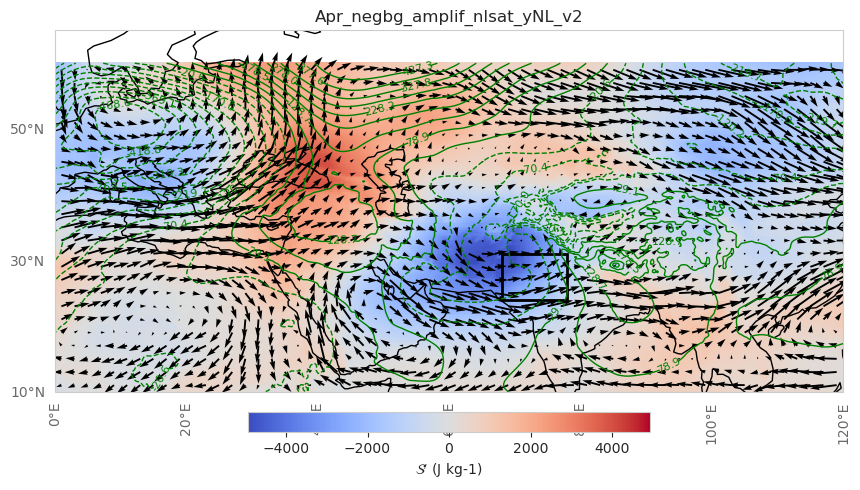

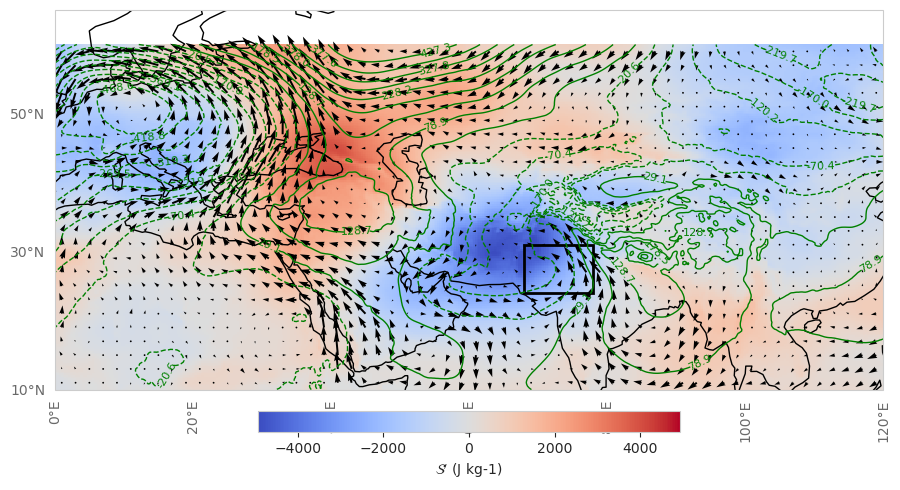

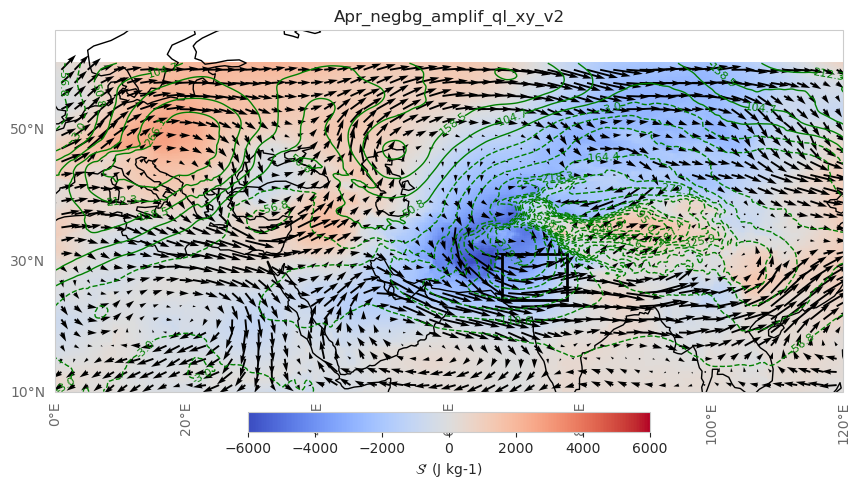

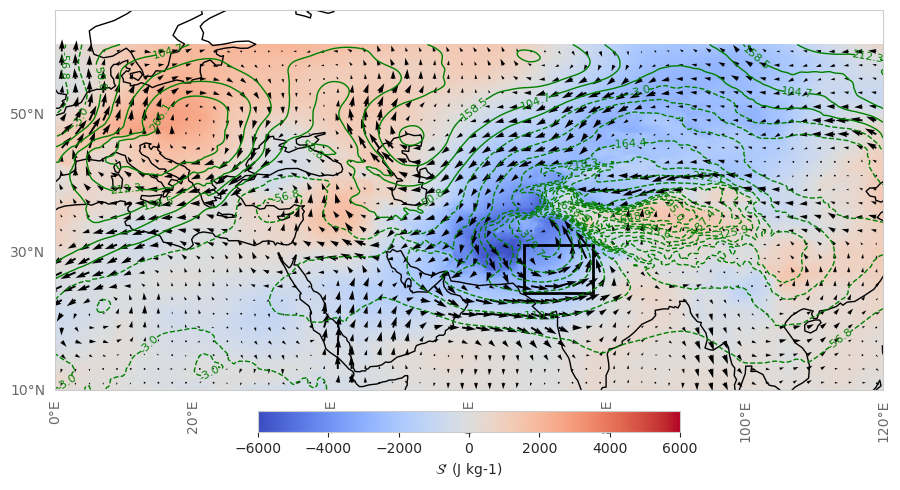

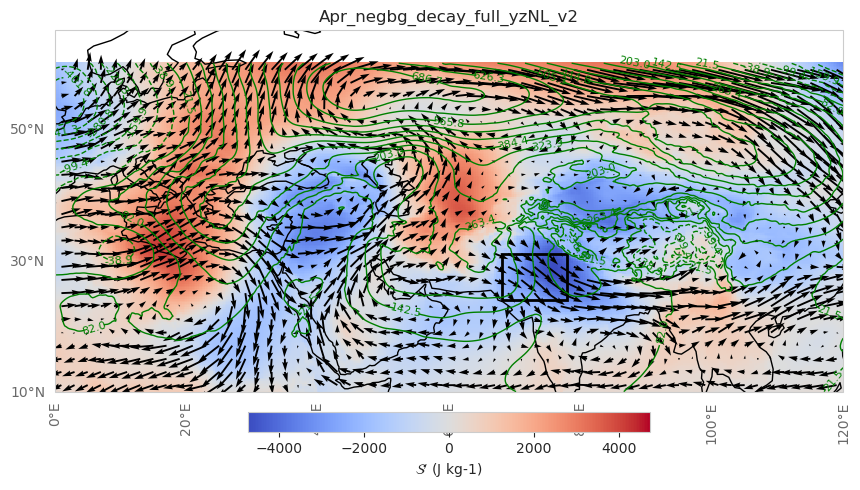

...

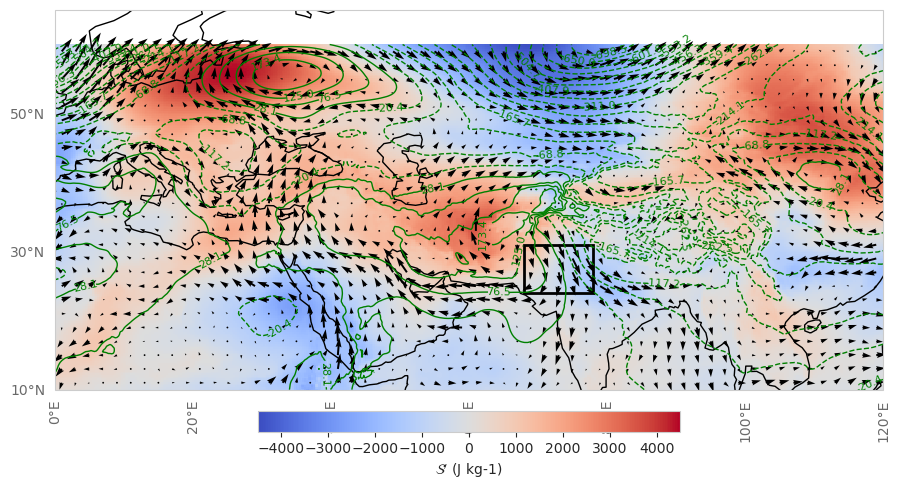

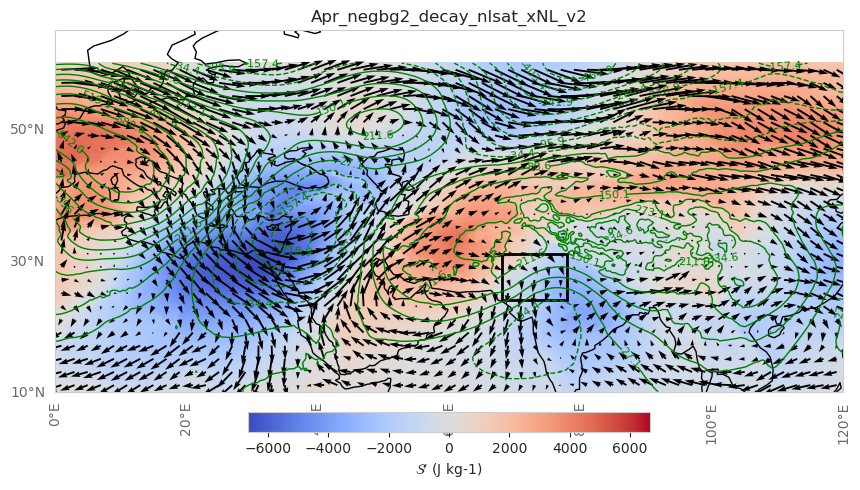

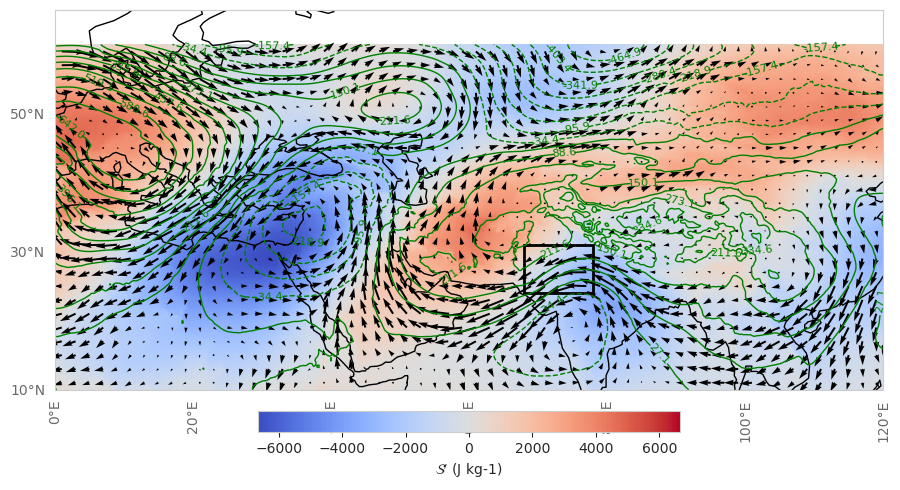

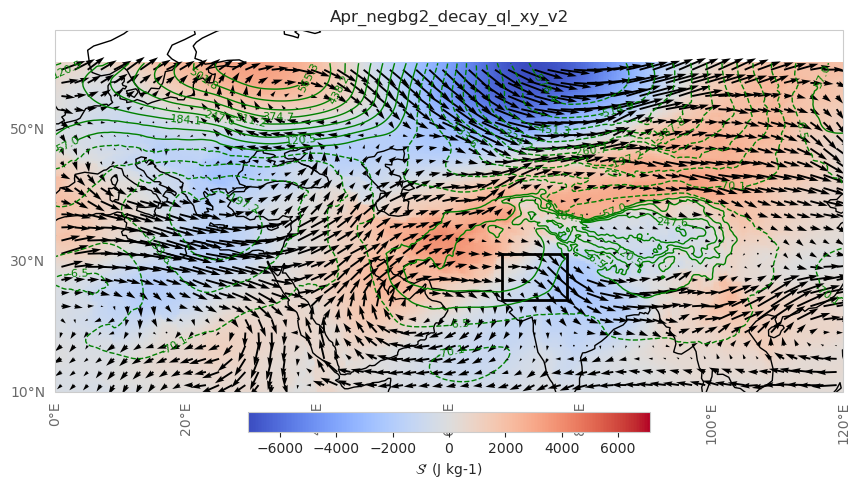

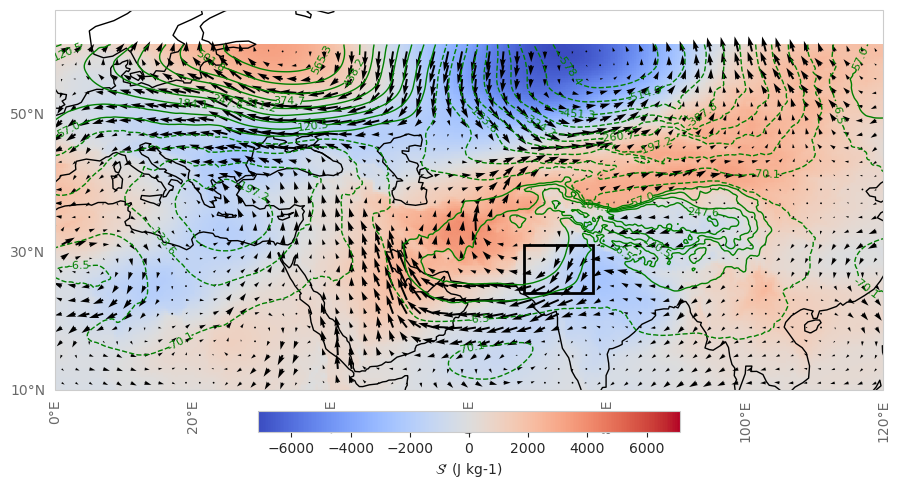

In [30]:
for i in range(len(files)):
    for two_day_averaging in [True]:
        file = files[i]
        print(i, file)

        # delete all pngs starting with the filename
        png_lst = [s for s in os.listdir(dir_plots) if s.startswith(file.replace('.csv', '')) and s.endswith('.png')]

        if len(png_lst) > 0:
            for png in png_lst:
                os.remove(dir_plots + png)
            
        df = pd.read_csv(dir_csv + file, parse_dates=['date'])
        print(df.shape)
        
        if two_day_averaging == True:
            nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')]
        else:
            nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

        print('len(nc_lst)', len(nc_lst))

        if 'Net_Adv' not in df.columns:
            df['Net_Adv'] = df['adv_recon_2Dave'].copy()

        os.chdir(dir_data)
        def preprocess(ds):
            return ds.expand_dims('date')

        ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
        print('ds_brnch', ds_brnch.dims)

        flux_dts = df.date.to_list()
        print(len(flux_dts))

        #########################################
    #     plot composites once
        save_str2 = file.replace('.csv', '_fullwnds_composite{}.png'.format('_2Dave' if two_day_averaging==True else ''))
        save_str4 = file.replace('.csv', '_anomwnds_composite{}.png'.format('_2Dave' if two_day_averaging==True else ''))

        u_var = 'u'; v_var = 'v'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()

        plot_composite(
            da_plt = da_plt, 
            da_cont = da_cont, 
            da_u = da_u, 
            da_v =da_v, 
            xmin=0, xmax=120, ymin=10, ymax=65, 
            cont_divisions=20, coarsen_pts=8, 
            t_type = 'dse_anom', scale_quiv= 200, 
            title_str = file.replace('.csv',''), 
            save_str = save_str2 
        )

        gc.collect()
        gc.collect()

        u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()


        plot_composite(        
            da_plt = da_plt, 
            da_cont = da_cont, 
            da_u = da_u, 
            da_v =da_v, 
            xmin=0, xmax=120, ymin=10, ymax=65, 
            cont_divisions=20, coarsen_pts=8,
            t_type = 'dse_anom', scale_quiv= 200, 
        #   title_str = 'dse_flx = {}, date = {}'.format(tot_flx, str(df.date.iloc[i].date()))

            save_str = save_str4
        )
        gc.collect()
        gc.collect()


        ########################################
        ## each figure has 11 rows * 2 cols = 22 plots
        num_instances_22 = int(np.round((len(flux_dts)/22)))
        rmndr_plts = int(len(flux_dts)%22)
        tot_rnds = num_instances_22 + (1 if rmndr_plts>2 else 0)
        
        if tot_rnds==0:
            continue

        for n in range(1, tot_rnds+1):
            if (tot_rnds == 1) & (num_instances_22 == 0): # there are less than 22 instances and there is only the first round
                globals()[f'brnch_dates_{n}'] = flux_dts
            elif tot_rnds == num_instances_22: # each of the >=1 rounds has 22 instances
                globals()[f'brnch_dates_{n}'] = flux_dts[(n-1)*22:n*22]
            elif tot_rnds > num_instances_22: # last figure has < 22 plots
                if n <= num_instances_22: 
                    globals()[f'brnch_dates_{n}'] = flux_dts[(n-1)*22:n*22]
                if n > num_instances_22: 
                    globals()[f'brnch_dates_{n}'] = flux_dts[-1*rmndr_plts:]
                    
            save_str1 = file.replace('.csv', '_fullwnds_{}.png'.format(str(n) + ('_2Dave' if two_day_averaging==True else '')))
            save_str3 = file.replace('.csv', '_anomwnds_{}.png'.format(str(n) + ('_2Dave' if two_day_averaging==True else '')))

    #         brnch_dates = random.sample(flux_dts, 22 if df.shape[0] > 22 else df.shape[0])
    #         plot_samples(ds = ds_brnch, save_str = save_str1)

            ds = ds_brnch.sel(date=globals()[f'brnch_dates_{n}'])

            u_var = 'u'; v_var = 'v'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
            plot_samples(ds = ds, save_str = save_str1)
            gc.collect()
            gc.collect()

            u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        #     plot_samples(ds = ds_brnch.sel(date=brnch_dates), save_str = save_str3)
            plot_samples(ds = ds, save_str = save_str3)
            gc.collect()
            gc.collect()


## Save only composites with standardized colorbar, quivers; and formatted with font and sizes

In [31]:
params = {
    'legend.fontsize': 15,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':20, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':15,
         'ytick.labelsize':15, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
        'font.family': 'DejaVu Serif',
}

plt.rcParams.update(params)


[30. 60. 90.]
[10. 30. 50.]
0 Apr_negbg_amplif_nlsat_yNL_v2.csv
(13, 27)
len(nc_lst) 13
ds_brnch Frozen({'date': 13, 'latitude': 201, 'longitude': 481})
13
vmin =  -4000
vmax =  4000
1 Apr_negbg_amplif_ql_xy_v2.csv
(12, 27)
len(nc_lst) 12
ds_brnch Frozen({'date': 12, 'latitude': 201, 'longitude': 481})
12
vmin =  -4000
vmax =  4000
2 Apr_negbg_decay_full_yzNL_v2.csv
(7, 27)
len(nc_lst) 7
ds_brnch Frozen({'date': 7, 'latitude': 201, 'longitude': 481})
7
vmin =  -4000
vmax =  4000
3 Apr_negbg_decay_ql_xy_z_v2.csv
(15, 27)
len(nc_lst) 15
ds_brnch Frozen({'date': 15, 'latitude': 201, 'longitude': 481})
15
vmin =  -4000
vmax =  4000
4 Apr_negbg_decay_ql_xy_v2.csv
(12, 28)
len(nc_lst) 12
ds_brnch Frozen({'date': 12, 'latitude': 201, 'longitude': 481})
12
vmin =  -4000
vmax =  4000
5 Apr_negbg2_amplif_full_xyNL_v2.csv
(6, 27)
len(nc_lst) 6
ds_brnch Frozen({'date': 6, 'latitude': 201, 'longitude': 481})
6
vmin =  -4000
vmax =  4000
6 Apr_negbg2_decay_nl_xyz_v2.csv
(6, 27)
len(nc_lst) 6
ds_brnc

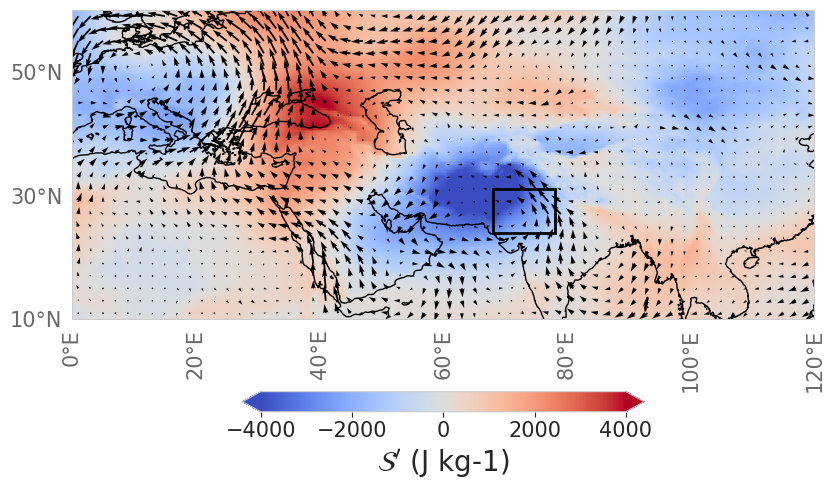

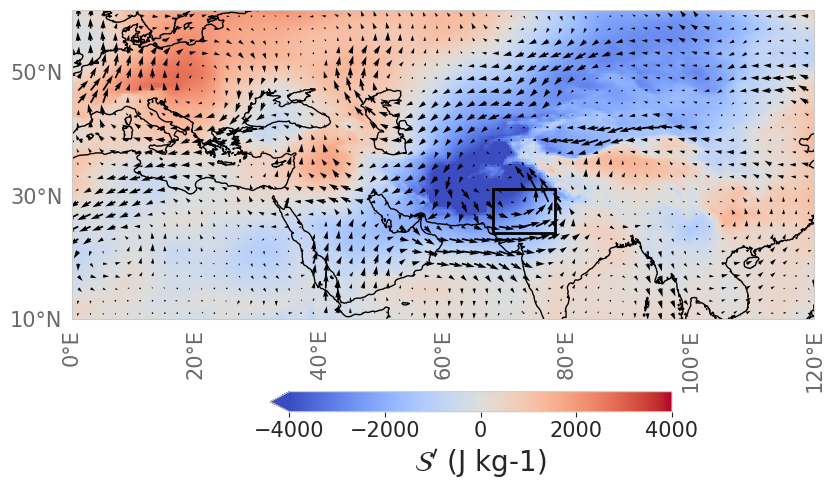

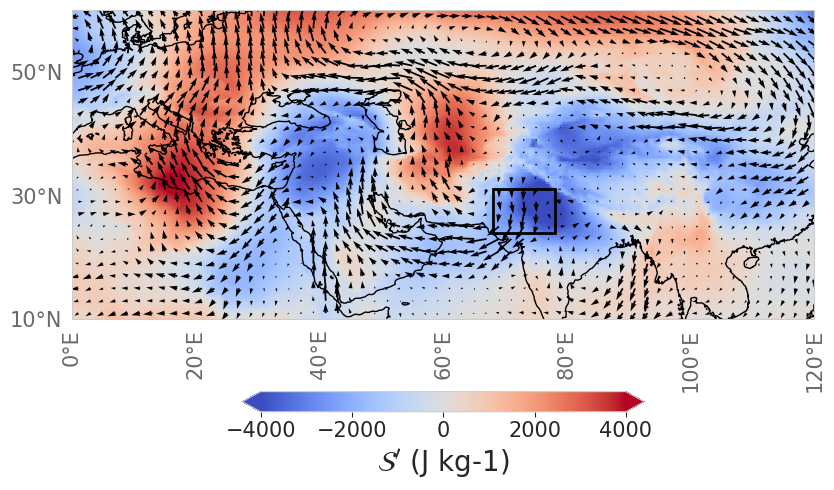

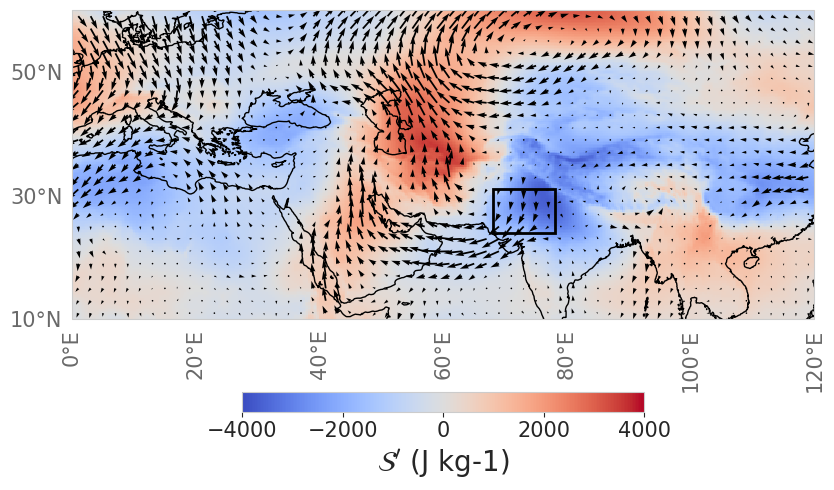

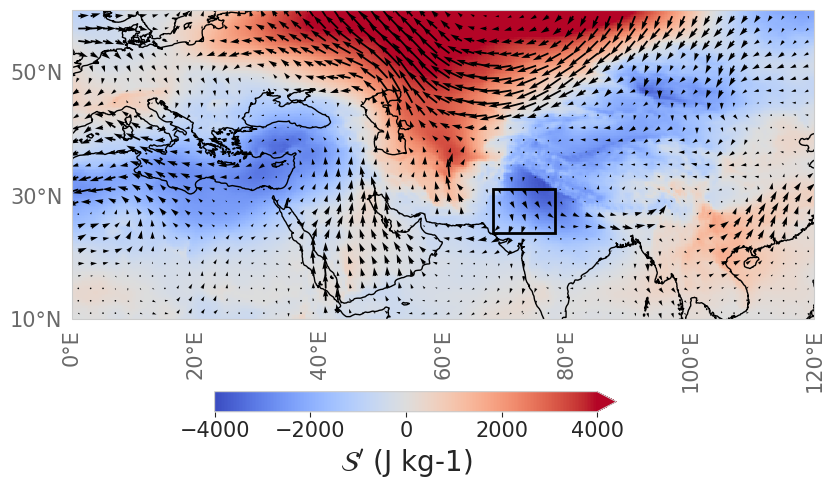

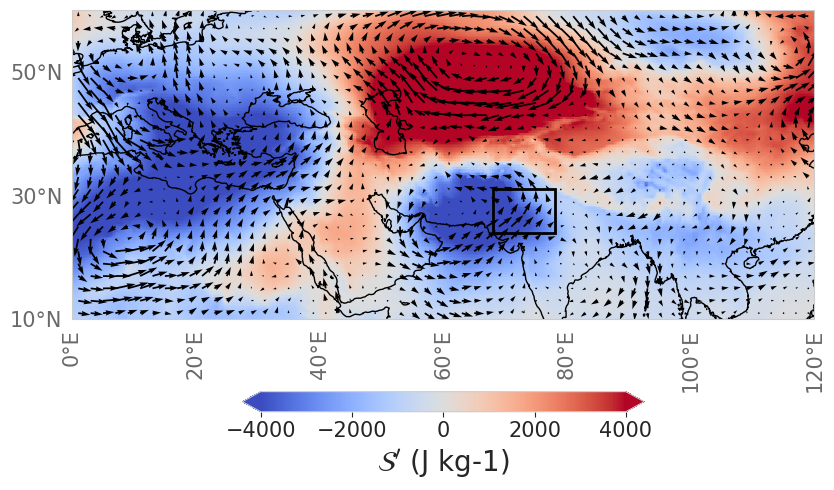

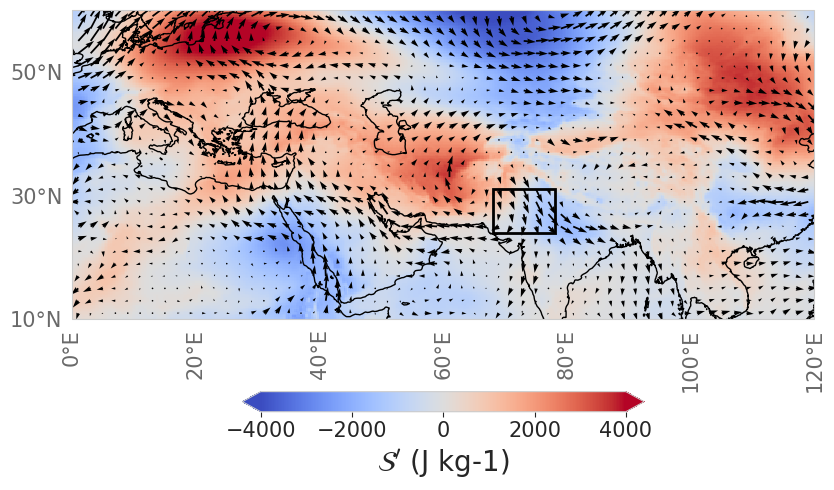

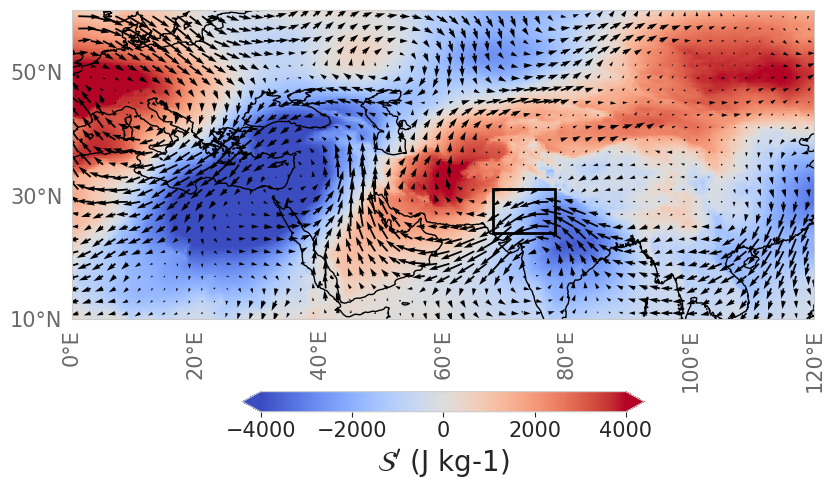

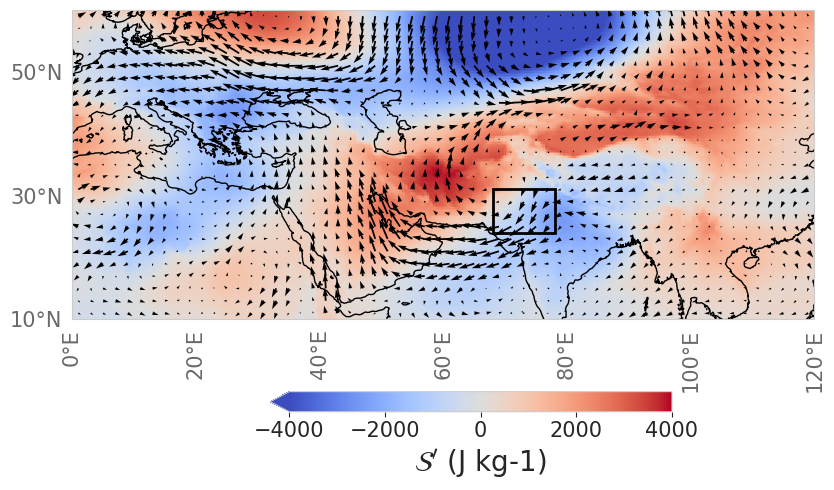

In [32]:
importlib.reload(composite_funcs)
from composite_funcs import *

for i in range(len(files)):
    for two_day_averaging in [True]:

        file = files[i]
        print(i, file)

        # delete all pngs starting with the filename
        png_lst = [s for s in os.listdir(dir_plots) if s.startswith(file.replace('.csv', '')) and s.endswith('.png')]

        if len(png_lst) > 0:
            for png in png_lst:
                os.remove(dir_plots + png)
            
        df = pd.read_csv(dir_csv + file, parse_dates=['date'])
        print(df.shape)
        
        if two_day_averaging == True:
            nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')]
        else:
            nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

        print('len(nc_lst)', len(nc_lst))
        
    
        if 'Net_Adv' not in df.columns:
            df['Net_Adv'] = df['adv_recon_2Dave'].copy()

        os.chdir(dir_data)
        def preprocess(ds):
            return ds.expand_dims('date')

        ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
        print('ds_brnch', ds_brnch.dims)

        flux_dts = df.date.to_list()
        print(len(flux_dts))

        #########################################
    #     plot composites once
        save_str4 = file.replace('.csv', '_anomwnds_composite{}.png'.format('_2Dave' if two_day_averaging==True else ''))

        u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()

        plot_composite(        
            da_plt = da_plt, 
            da_cont = da_cont, 
            da_u = da_u, 
            da_v =da_v, 
            xmin=da_plt.longitude.values.min().astype('int'), 
            xmax=da_plt.longitude.values.max().astype('int'), 
            ymin=da_plt.latitude.values.min().astype('int'), 
            ymax=da_plt.latitude.values.max().astype('int'), 
            vmin_in = -4000, vmax_in = 4000,
            contours='off', 
            cbar_pad=0.18,
            cont_divisions=20, coarsen_pts=8,
            t_type = 'dse_anom', scale_quiv= 200, 
            latlon_ticksz=10, 
            latlon_tickcol = 'dimgray',
            dir_out = '/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/plots_final/',
        #   title_str = 'dse_flx = {}, date = {}'.format(tot_flx, str(df.date.iloc[i].date()))
            save_str = save_str4
        )
        gc.collect()
        gc.collect()


In [126]:
files.sort(key = lambda s: (s.split('_')[2], s.split('_')[3], s.split('_')[4]))

In [132]:
files

['Apr_negbg1_amplif_full_xNL_v2.csv', 'Apr_negbg1_decay_ql_xy_z_v2.csv']

In [35]:
files2=[]

In [36]:
for csv in csvs_negbg:
    if pd.read_csv(dat_dir + csv).shape[0]>10:
        files2.append(csv)


In [37]:
files2

['Apr_negbg_amplif_nlsat_yNL_v2.csv',
 'Apr_negbg_amplif_ql_xy_v2.csv',
 'Apr_negbg2_decay_nlsat_xNL_v2.csv',
 'Apr_negbg_decay_ql_xy_z_v2.csv',
 'Apr_negbg_decay_ql_xy_v2.csv',
 'Apr_negbg2_decay_ql_xy_v2.csv']

In [38]:
[' '.join(files[i].split('_')[2:4]).title().replace('Nl', 'NL').replace('Ql','QL') for 
i in range(len(files))]

['Amplif Full',
 'Amplif NLsat',
 'Amplif QL',
 'Decay Full',
 'Decay NL',
 'Decay NLsat',
 'Decay QL',
 'Decay QL',
 'Decay QL']

In [46]:
importlib.reload(composite_funcs)
from composite_funcs import *

[30. 60. 90.]
[10. 30. 50.]


## NegBG composite

[30. 60. 90.]
[10. 30. 50.]
0 Apr_negbg1_amplif_full_xNL_v2.csv
(9, 16)
len(nc_lst) 9
ds_brnch Frozen({'date': 9, 'latitude': 201, 'longitude': 481})
9
vmin =  -4000
vmax =  4000
1 Apr_negbg1_decay_ql_xy_z_v2.csv
(12, 27)
len(nc_lst) 12
ds_brnch Frozen({'date': 12, 'latitude': 201, 'longitude': 481})
12
vmin =  -4000
vmax =  4000


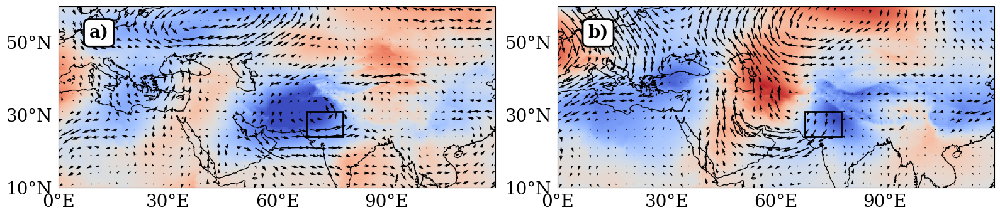

In [129]:
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['DejaVu Serif']

params = {
    'legend.fontsize': 15,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':20, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':20,
         'ytick.labelsize':20, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
#         'font.family': 'DejaVu Serif',
}

plt.rcParams.update(params)

importlib.reload(composite_funcs)
from composite_funcs import *

# files_final = [s for s in files if s not in [
#     'Apr_negbg_decay_ql_xy_z_v2.csv',
# 'Apr_negbg_decay_ql_xy_v2.csv', 
# 'Apr_negbg2_decay_nl_xyz_v2.csv']]

files_final = files

props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='k', linewidth=2)
border_thickness = 5
plt.rcParams['axes.titlesize'] = 15
k=0

nrow = round(len(files_final)/2)
ncol = 2

fig, ax = plt.subplots(
    nrows=nrow, ncols=ncol, 
    sharey=False, 
    subplot_kw={'projection': ccrs.PlateCarree()}, 
    figsize=(16,4*nrow),
    squeeze=False
#     gridspec_kw={'hspace': 0.05}
)

# for i in range(len(files2)):
for i in range(len(files_final)):
# for i in [i for i in range(len(files)) if i != len(files)-3]:
    for two_day_averaging in [True]:
        file = files_final[i]
        print(i, file)
        
        rowind = bicol_panel_rownum(k)
        colind = bicol_panel_colnum(k)

        df = pd.read_csv(dir_csv + file, parse_dates=['date'])
        print(df.shape)
        
        if two_day_averaging == True:
            nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')]
        else:
            nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

        print('len(nc_lst)', len(nc_lst))
        
    
        if 'Net_Adv' not in df.columns:
            df['Net_Adv'] = df['adv_recon_2Dave'].copy()

        os.chdir(dir_data)
        def preprocess(ds):
            return ds.expand_dims('date')

        ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
        print('ds_brnch', ds_brnch.dims)

        flux_dts = df.date.to_list()
        print(len(flux_dts))

        #########################################
    #     plot composites once
        u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()

        plot_composite_final_plot(
            da_plt = da_plt, 
            da_cont = da_cont, 
            da_u = da_u, 
            da_v =da_v, 
            axi = ax[rowind, colind],
            xmin=da_plt.longitude.values.min().astype('int'), 
            xmax=da_plt.longitude.values.max().astype('int'), 
            ymin=da_plt.latitude.values.min().astype('int'), 
            ymax=da_plt.latitude.values.max().astype('int'), 
            vmin_in = -4000, vmax_in = 4000,
            
            cbar_on = False, #if rowind + 1 < nrow else True,
            cbar_pad= 0.1 if rowind + 1 < nrow else 0.3,
            t_type = 'dse_anom', 
            
            contours='off', 
            cont_divisions=20, 
            coarsen_pts=10,
            scale_quiv= 150, 
            
            latlon_ticksz=20, 
            latlon_tickcol = 'black',
            xtickrot=0,
            ytickrot=0,
            num_xticks=3,
            num_yticks=3
#             title_str = file + ', ' + str(df.shape[0])
        #   title_str = 'dse_flx = {}, date = {}'.format(tot_flx, str(df.date.iloc[i].date()))
        )
        
        ax[rowind, colind].text(
            .07, .9, '{})'.format(chr(96+(k+1))), 
            transform=ax[rowind, colind].transAxes, 
            fontsize=20, fontname ='DejaVu Serif', 
              verticalalignment='top', c='k', bbox=props, fontweight='bold'
        )

        ax[rowind, colind].spines["top"].set_linewidth(border_thickness)
        ax[rowind, colind].spines["right"].set_linewidth(border_thickness)
        ax[rowind, colind].spines["bottom"].set_linewidth(border_thickness)
        ax[rowind, colind].spines["left"].set_linewidth(border_thickness)
        # Customize border color
        for spine in ax[rowind, colind].spines.values():
            spine.set_color("black")

        k = k+1
        gc.collect()
        gc.collect()

# cbar_ax = fig.add_axes([0.91, 0.15, 0.03, 0.7])
# cbar = fig.colorbar(ax[0, 0].get_images()[0], cax=cbar_ax)
# cbar.set_label('$\mathcal{S}\'$ (J kg$^{-1}$)')

for r in range(nrow):
    for c in range(ncol):
        for label in ax[r][c].get_xticklabels() + ax[r][c].get_yticklabels():
            label.set_fontname('DejaVu Serif')

# comp_anns = [
    
#     '$v\' \mathcal{S}\'_{y}\ll0$,\n$u\'\mathcal{S}\'_{x}\ll0$',  # ql + nl growth
#     '$v\' \mathcal{S}\'_{y}\gg0$', # NL sat growth
#     '$v\'\mathcal{S}\'_{y}>0$,\n$u\'\mathcal{S}\'_{x}<0$', # ql growth
#     '$w\'\mathcal{S}\'_{z}\gg0$', # ql + nl(z) decay
#     '$u\' \mathcal{S}\'_{x}\ll0$', # nl(x) sat decay
#     '$v\'\mathcal{S}\'_{y}>0$,\n$u\'\mathcal{S}\'_{x}<0$' # ql decay,
# ]


# props = dict(boxstyle='round,pad=0.5', facecolor='whitesmoke', alpha=1, edgecolor='black')
# annot_size = 18
# ann_coords = [.65, .7]
# fontname = 'DejaVu Serif'
# # props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='k', linewidth=2)

# arrow_tip_y = 0.35
# arrow_tip_x = 0.65
# k=0
# bbox = ax[r][c].get_position()
# ref_height = 0.24  # Use the larger axes height as reference
# scaled_fontsize = int(annot_size * bbox.height / ref_height)

# for r in range(3):
#     for c in range(2):
#         if not ((r==2) and (c==1)):
#             ax[r][c].annotate(
#                 text=comp_anns[k],  # LaTeX-style annotation
#                 xy=(arrow_tip_x, arrow_tip_y),        # Where the arrow points (in Axes coords)
#                 xytext=(ann_coords[0], ann_coords[1]),# Where the text box is placed
#                 textcoords='axes fraction',
#                 xycoords='axes fraction',
#                 fontsize=annot_size,
#                 fontname=fontname,
#                 verticalalignment='top',
#                 color='black',
#                 bbox=props,
#     #                 arrowprops=dict(
#     #                     arrowstyle='->',
#     #                     facecolor="white",
#     #                     color='black',
#     #                     linewidth=2,
#     #                 )
#             )
        
# #         if c==1:
# #             ax[r][c].set_yticklabels([])
# #         if r != 2:
# #             ax[r][c].set_xticklabels([])

#         k = k +1

plt.tight_layout()
# plt.subplots_adjust(hspace=0.2) 
# fig.subplots_adjust(hspace=0.01, wspace=0.05)
# 
# plt.savefig('/home/data/lab_hardik/Manuscript1/Fig_Apr_regimes_negbg.pdf', bbox_inches='tight')


In [130]:
files

['Apr_negbg1_amplif_full_xNL_v2.csv', 'Apr_negbg1_decay_ql_xy_z_v2.csv']

In [189]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
importlib.reload(composite_funcs)
from composite_funcs import *

0 Apr_negbg1_amplif_full_xNL_v2.csv
(9, 16)
len(nc_lst) 9
ds_brnch Frozen({'date': 9, 'latitude': 201, 'longitude': 481})
9
vmin =  -4000
vmax =  4000
1 Apr_negbg_amplif_nlsat_yNL_v2.csv
(13, 27)
len(nc_lst) 13
ds_brnch Frozen({'date': 13, 'latitude': 201, 'longitude': 481})
13
vmin =  -4000
vmax =  4000
2 Apr_negbg_amplif_ql_xy_v2.csv
(12, 27)
len(nc_lst) 12
ds_brnch Frozen({'date': 12, 'latitude': 201, 'longitude': 481})
12
vmin =  -4000
vmax =  4000
3 Apr_negbg_decay_full_yzNL_v2.csv
(7, 27)
len(nc_lst) 7
ds_brnch Frozen({'date': 7, 'latitude': 201, 'longitude': 481})
7
vmin =  -4000
vmax =  4000
4 Apr_negbg2_decay_nlsat_xNL_v2.csv
(13, 27)
len(nc_lst) 13
ds_brnch Frozen({'date': 13, 'latitude': 201, 'longitude': 481})
13
vmin =  -4000
vmax =  4000
5 Apr_negbg1_decay_ql_xy_z_v2.csv
(12, 27)
len(nc_lst) 12
ds_brnch Frozen({'date': 12, 'latitude': 201, 'longitude': 481})
12
vmin =  -4000
vmax =  4000


/tmp/ipykernel_797646/554062990.py:277: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


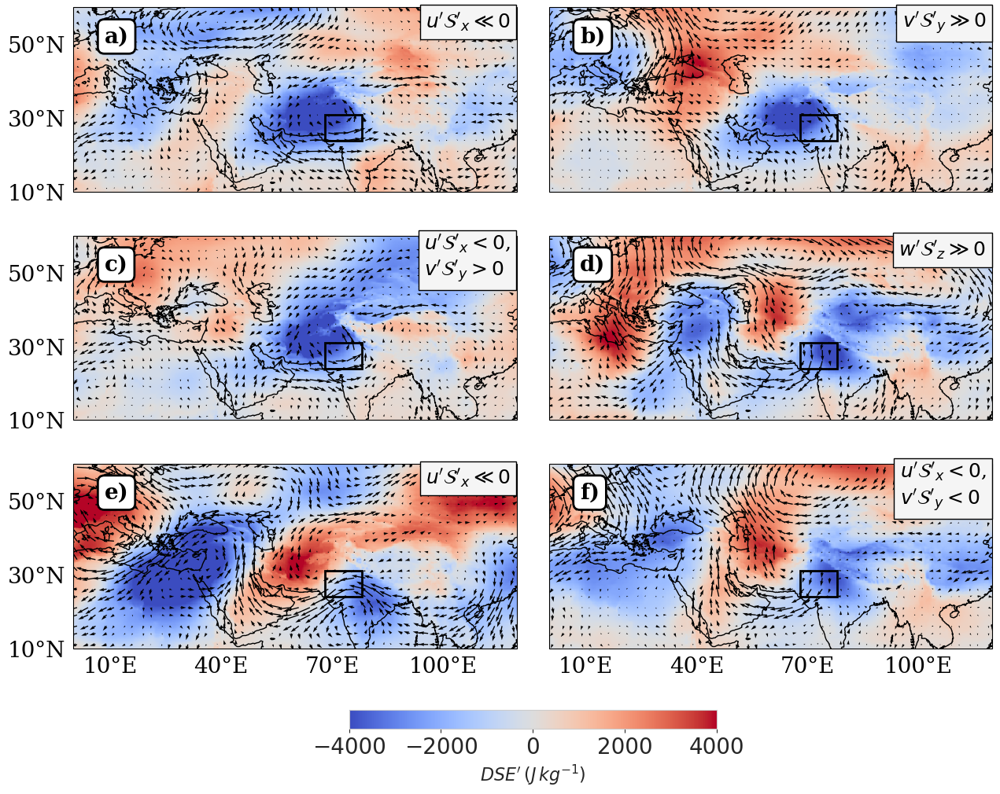

In [201]:
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['DejaVu Serif']

params = {
    'legend.fontsize': 15,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':20, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':20,
         'ytick.labelsize':20, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
#         'font.family': 'DejaVu Serif',
}

plt.rcParams.update(params)

importlib.reload(composite_funcs)
from composite_funcs import *

# files_final = [s for s in files if s not in [
#     'Apr_negbg_decay_ql_xy_z_v2.csv',
# 'Apr_negbg_decay_ql_xy_v2.csv', 
# 'Apr_negbg2_decay_nl_xyz_v2.csv']]

files_final = [files[i] for i in [3,0,1,2,-1,-2]]

props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='k', linewidth=2)
border_thickness = 5
plt.rcParams['axes.titlesize'] = 15
k=0

nrow = round(len(files_final)/2)
ncol = 2

fig, ax = plt.subplots(
    nrows=nrow, ncols=ncol, 
    sharey=False, 
    subplot_kw={'projection': ccrs.PlateCarree()}, 
    figsize=(16,4*nrow),
#     gridspec_kw={'hspace': 0.05}
)

# for i in range(len(files2)):
for i in range(len(files_final)):
# for i in [i for i in range(len(files)) if i != len(files)-3]:
    for two_day_averaging in [True]:
        file = files_final[i]
        print(i, file)
        
        rowind = bicol_panel_rownum(k)
        colind = bicol_panel_colnum(k)

        df = pd.read_csv(dir_csv + file, parse_dates=['date'])
        print(df.shape)
        
        if two_day_averaging == True:
            nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')]
        else:
            nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

        print('len(nc_lst)', len(nc_lst))
        
    
        if 'Net_Adv' not in df.columns:
            df['Net_Adv'] = df['adv_recon_2Dave'].copy()

        os.chdir(dir_data)
        def preprocess(ds):
            return ds.expand_dims('date')

        ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
        print('ds_brnch', ds_brnch.dims)

        flux_dts = df.date.to_list()
        print(len(flux_dts))

        #########################################
    #     plot composites once
        u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()

        plot_composite_final_plot(
            da_plt = da_plt, 
            da_cont = da_cont, 
            da_u = da_u, 
            da_v =da_v, 
            axi = ax[rowind, colind],
            xmin=da_plt.longitude.values.min().astype('int'), 
            xmax=da_plt.longitude.values.max().astype('int'), 
            ymin=da_plt.latitude.values.min().astype('int'), 
            ymax=da_plt.latitude.values.max().astype('int'), 
            vmin_in = -4000, vmax_in = 4000,
            
            cbar_on = False, #if rowind + 1 < nrow else True,
            cbar_pad= 0.1 if rowind + 1 < nrow else 0.3,
            t_type = 'dse_anom', 
            
            contours='off', 
            cont_divisions=20, 
            coarsen_pts=10,
            scale_quiv= 150, 
            
            latlon_ticksz=20, 
            latlon_tickcol = 'black',
            xtickrot=0,
            ytickrot=0,
            num_xticks=4,
            num_yticks=3,
            xtick_offset=10

#             title_str = file + ', ' + str(df.shape[0])
        #   title_str = 'dse_flx = {}, date = {}'.format(tot_flx, str(df.date.iloc[i].date()))
        )
        
        ax[rowind, colind].text(
            .07, .9, '{})'.format(chr(96+(k+1))), 
            transform=ax[rowind, colind].transAxes, 
            fontsize=20, fontname ='DejaVu Serif', 
              verticalalignment='top', c='k', bbox=props, fontweight='bold'
        )

        ax[rowind, colind].spines["top"].set_linewidth(border_thickness)
        ax[rowind, colind].spines["right"].set_linewidth(border_thickness)
        ax[rowind, colind].spines["bottom"].set_linewidth(border_thickness)
        ax[rowind, colind].spines["left"].set_linewidth(border_thickness)
        # Customize border color
        for spine in ax[rowind, colind].spines.values():
            spine.set_color("black")

        k = k+1
        gc.collect()
        gc.collect()

# cbar_ax = fig.add_axes([0.91, 0.15, 0.03, 0.7])

for r in range(nrow):
    for c in range(ncol):
        for label in ax[r][c].get_xticklabels() + ax[r][c].get_yticklabels():
            label.set_fontname('DejaVu Serif')

comp_anns = [
    
#     '$v\' \mathcal{S}\'_{y}\ll0$,\n$u\'\mathcal{S}\'_{x}\ll0$',  # ql + nl growth
    '$u\'\mathcal{S}\'_{x}\ll0$',  # ql + nl growth
    '$v\' \mathcal{S}\'_{y}\gg0$', # NL sat growth
    '$u\'\mathcal{S}\'_{x}<0$,\n$v\'\mathcal{S}\'_{y}>0$', # ql growth
    '$w\'\mathcal{S}\'_{z}\gg0$', # ql + nl(z) decay
#     '$v\'\mathcal{S}\'_{y}\ll0$', # ql + nl(z) decay
    '$u\' \mathcal{S}\'_{x}\ll0$', # nl(x) sat decay
    '$u\'\mathcal{S}\'_{x}<0$,\n$v\'\mathcal{S}\'_{y}<0$' # ql decay,
]


# props = dict(boxstyle='round,pad=0.5', facecolor='whitesmoke', alpha=1, edgecolor='black')
props = dict(boxstyle='square', facecolor='whitesmoke', alpha=1, edgecolor='black')
annot_size = 23

fontname = 'DejaVu Serif'
# props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='k', linewidth=2)

# ann_coords = [.9, .9]
# box_width = 0.12  # estimated width in axes fraction
# box_height = 0.08  # estimated height in axes fraction

ann_coords = [1, 1]

arrow_tip_y = 0.35
arrow_tip_x = 0.65
k=0
# bbox = ax[r][c].get_position()
ref_height = 0.24  # Use the larger axes height as reference
scaled_fontsize = int(annot_size * bbox.height / ref_height)

for r in range(3):
    for c in range(2):
#         if not ((r==2) and (c==1)):
#         ax[r][c].annotate(
#             text=comp_anns[k],  # LaTeX-style annotation
#             xy=(arrow_tip_x, arrow_tip_y),        # Where the arrow points (in Axes coords)
#             xytext=(ann_coords[0], ann_coords[1]),# Where the text box is placed
#             textcoords='axes fraction',
#             xycoords='axes fraction',
#             verticalalignment='top',
#             horizontalalignment='right',

#             fontsize=annot_size,
#             fontname=fontname,
# #             verticalalignment='top',
#             color='black',
#             bbox=props,
# #                 arrowprops=dict(
# #                     arrowstyle='->',
# #                     facecolor="white",
# #                     color='black',
# #                     linewidth=2,
# #                 )
#         )
        renderer = fig.canvas.get_renderer()
        text_obj = ax[r][c].annotate(
            text=comp_anns[k],
            xy=(arrow_tip_x, arrow_tip_y),
            xytext=(1.0, 1.0),
            textcoords='axes fraction',
            xycoords='axes fraction',
            fontsize=scaled_fontsize,
            fontname=fontname,
            verticalalignment='top',
            horizontalalignment='right',
            color='black',
            bbox=props,
        )

        # Get bounding box in display coordinates
        bbox_display = text_obj.get_window_extent(renderer=renderer)

        # Convert to axes fraction
        bbox_axes = ax[r][c].transAxes.inverted().transform_bbox(bbox_display)
        box_width = bbox_axes.width
        box_height = bbox_axes.height

        # for rounded edges
#         if ((r==1) and (c==0)) or ((r==2) and (c==1)):
#             text_obj.set_position((1.0 - box_width + 0.0145, 1.0 - box_height - 0.012))
#         else:
#             text_obj.set_position((1.0 - box_width + 0.0145, 1.0 - box_height - 0.02))

#         # for sharp edges
#         if ((r==1) and (c==0)) or ((r==2) and (c==1)):
#             text_obj.set_position((1.0 - box_width + 0.02, 1.0 - box_height + 0.02))
#         else:
#             text_obj.set_position((1.0 - box_width + 0.02, 1.0 - box_height - 0.004)) #  - 0.008
    
        # for sharp edges
        if ((r == 1) and (c==0)) or ((r==2) and (c==1)):
            text_obj.set_position((1.0 - box_width - 0.014, 1.0 - box_height - 0.025)) #  - 0.008
        else:
            text_obj.set_position((1.0 - box_width - 0.014, 1.0 - box_height- 0.035)) #

#         if ((r==0) or (r==1)) and (c==1):
#             text_obj.set_position((1.0 - box_width - 0.012, 1.0 - box_height- 0.045)) #

#         if ((r==0) or (r==1)) and (c==0):
#             text_obj.set_position((1.0 - box_width - 0.012, 1.0 - box_height- 0.055)) #

                
        text_obj.set_ha('left')
        text_obj.set_va('bottom')

        if (r != (nrow-1)):
            ax[r,c].set_xticks([])                
        if (c != 0):
            ax[r,c].set_yticks([])
        k = k +1

# fig.tight_layout()
# plt.subplots_adjust(hspace=0.2) 
# fig.subplots_adjust(hspace=0.01, wspace=0.05)

for r in range(nrow):
    for c in range(ncol):
        pos = ax[r, c].get_position()
        # Shift upward and compress height
        ax[r, c].set_position([
            pos.x0 - 0.045 * (ncol + c - 2),
            pos.y0 + 0.03 * (nrow + r - 3),  # shift higher rows up more
            pos.width,
            pos.height               # compress height slightly
        ])

norm = colors.Normalize(vmin=-4000, vmax=4000)
cmap = cm.get_cmap('coolwarm')
mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
mappable.set_array([])  # Required for colorbar to work

bbox_left = ax[2, 0].get_position()
bbox_right = ax[2, 1].get_position()

# Compute full horizontal span
left_edge = bbox_left.x0
right_edge = bbox_right.x0 + bbox_right.width
new_center = (left_edge + right_edge) / 2
new_total_width = right_edge - left_edge

# Define colorbar dimensions
new_width = new_total_width * 0.4  # narrower than full span
new_left = new_center - new_width / 2
new_bottom = bbox_left.y0 - 0.085
new_height = 0.02

# Create colorbar axis and draw colorbar
cbar_ax = fig.add_axes([new_left, new_bottom, new_width, new_height])

cbar = fig.colorbar(mappable, cax=cbar_ax, orientation='horizontal')
cbar.set_label('$DSE\'\,(J\,kg^{-1})$', fontsize=16)

plt.savefig('/home/data/lab_hardik/Manuscript1/Fig_Apr_regimes_negbg.pdf', bbox_inches=None)

In [139]:
[files[i] for i in [3,0,1,2,-1,-2]]

['Apr_negbg1_amplif_full_xNL_v2.csv',
 'Apr_negbg_amplif_nlsat_yNL_v2.csv',
 'Apr_negbg_amplif_ql_xy_v2.csv',
 'Apr_negbg_decay_full_yzNL_v2.csv',
 'Apr_negbg2_decay_nlsat_xNL_v2.csv',
 'Apr_negbg1_decay_ql_xy_z_v2.csv']

In [90]:
for r in range(nrow):
    for c in range(ncol):
        bbox = ax[r][c].get_position()
        print(f"Axes[{r},{c}] width: {bbox.width:.2f}, height: {bbox.height:.2f}")

Axes[0,0] width: 0.43, height: 0.24
Axes[0,1] width: 0.43, height: 0.24
Axes[1,0] width: 0.43, height: 0.24
Axes[1,1] width: 0.43, height: 0.24
Axes[2,0] width: 0.43, height: 0.24
Axes[2,1] width: 0.43, height: 0.24


In [82]:
fig.get_dpi()

100.0

In [79]:
for label in ax[0][0].get_xticklabels():
    print(label.get_fontname())


DejaVu Serif
DejaVu Serif
DejaVu Serif
DejaVu Serif


In [70]:
plt.rcParams['font.family']

['sans-serif']

In [96]:
files_final

['Apr_negbg2_amplif_full_xyNL_v2.csv',
 'Apr_negbg_amplif_nlsat_yNL_v2.csv',
 'Apr_negbg_amplif_ql_xy_v2.csv',
 'Apr_negbg_decay_full_yzNL_v2.csv',
 'Apr_negbg2_decay_nlsat_xNL_v2.csv',
 'Apr_negbg2_decay_ql_xy_v2.csv']

In [91]:
pd.read_csv(dir_csv + "Apr_negbg2_decay_nlsat_xNL_v2.csv").iloc[:,:12]

,date,$u'$$\mathcal{S}^'_x$,$v'$$\mathcal{S}^'_y$,$w'$$\mathcal{S}^'_z$,$v'$$\mathcal{S}̅_y$,$w'$$\mathcal{S}̅_z$,${u̅}$$\mathcal{S}^'_x$,T_main,NL_sum,x_contrib_NL,y_contrib_NL,z_contrib_NL
0,1984-04-23,-1473.318512,73.724916,807.667580,-943.506254,1172.039816,1425.740164,1654.273726,-591.926015,62.568974,3.130954,34.300072
1,1984-04-24,-1466.912017,333.525882,493.519555,-648.952131,865.399094,1303.548950,1519.995913,-639.866580,63.946784,14.539323,21.513893
2,1987-04-16,-375.079637,155.547568,-218.023521,-859.479058,979.607549,1040.263870,1160.392360,-437.555590,50.100751,20.777054,29.122195
3,1987-04-26,-589.728252,-126.884187,139.629013,-611.289237,160.480331,1300.104222,849.295317,-576.983425,68.874060,14.818739,16.307201
4,1990-04-05,-847.567937,-6.071186,155.427295,1.049769,-875.810652,1790.719104,915.958222,-698.211828,83.995258,0.601664,15.403079
5,2011-04-04,-137.672895,98.448450,-382.848466,-677.911176,1203.839814,423.359078,949.287716,-422.072910,22.242263,15.905210,61.852526
6,2011-04-22,-866.879057,184.137909,-47.197761,-428.419873,517.617156,1091.919787,1181.117069,-729.938909,78.935297,16.767022,4.297681
7,2011-04-23,-954.656507,344.878345,13.489536,-517.271508,352.367650,1185.124336,1020.220478,-596.288627,72.706685,26.265951,1.027364
8,2015-04-13,-2816.440062,1257.045964,459.145868,-1034.172071,558.990804,1876.851373,1401.670106,-1100.248230,62.136969,27.733246,10.129785
9,2015-04-14,-3729.448162,1475.538312,665.862800,-1080.253019,828.885342,2169.049950,1917.682272,-1588.047050,63.524849,25.133303,11.341848


In [57]:
pd.read_csv(dir_csv + "Apr_negbg_amplif_nlsat_yNL_v2.csv")

,date,$u'$$\mathcal{S}^'_x$,$v'$$\mathcal{S}^'_y$,$w'$$\mathcal{S}^'_z$,$v'$$\mathcal{S}̅_y$,$w'$$\mathcal{S}̅_z$,${u̅}$$\mathcal{S}^'_x$,T_main,NL_sum,x_contrib_NL,...,$v'$,$w'$,$\mathcal{S}^'_x$,$\mathcal{S}^'_z$,${u̅}$,${v̅}$,${w̅}$,$\mathcal{S}̅_x$,$\mathcal{S}̅_y$,$\mathcal{S}̅_z$
0,1983-04-03,106.243383,268.630426,223.281157,2422.993899,-1178.400855,-2202.424591,-957.831547,598.154967,17.761849,...,5.458772,0.005959,0.004547,0.032730,6.633121,-0.568290,-0.001013,0.000112,-0.005130,2.110496
1,1983-04-17,-274.611781,912.539812,-219.057868,965.698377,-686.177457,-1076.497303,-796.976384,418.870164,19.528512,...,2.790107,0.003791,0.001739,0.524326,5.565398,-0.667875,-0.000049,-0.000002,-0.003662,1.880449
2,1989-04-15,-69.844105,324.900703,292.099832,479.088264,-495.169096,-743.918005,-759.998837,547.156431,10.168836,...,1.336408,0.003371,0.001590,-0.392868,5.635005,-0.641175,-0.000278,-0.000014,-0.003863,1.858495
3,1991-04-13,289.955349,1544.509940,-908.798128,1542.282596,-2125.181596,-159.659182,-742.558182,925.667161,10.569723,...,4.169302,0.012724,0.000798,1.044166,5.852696,-0.588590,-0.000315,0.000093,-0.004157,1.899635
4,1991-04-14,-607.076966,1648.245146,-526.317879,1319.662432,-1225.426693,-927.830776,-833.595037,514.850301,21.824426,...,3.497858,0.007016,0.002132,0.969768,5.736028,-0.624444,-0.000331,0.000020,-0.004017,1.890529
5,1993-04-07,273.356611,543.193060,180.124625,1073.636552,-1076.871227,-1242.455451,-1245.690126,996.674296,27.426875,...,2.523330,0.006420,0.002211,-0.181227,6.573402,-0.568517,-0.000725,0.000124,-0.004863,2.011030
6,1994-04-14,266.165223,607.289666,52.007589,1548.579839,-984.170082,-1345.684548,-781.274790,925.462478,28.760239,...,4.040257,0.005323,0.003193,-0.078314,5.737012,-0.624745,-0.000331,0.000020,-0.004017,1.894238
7,1994-04-15,16.839116,658.016651,-53.456260,930.480537,-728.511188,-1233.756103,-1031.786754,621.399507,2.312074,...,2.307836,0.003875,0.002747,0.282209,5.633930,-0.640955,-0.000277,-0.000014,-0.003864,1.877587
8,1995-04-10,362.045146,377.075360,9.931386,1882.584939,-1167.242993,-1866.741624,-1151.399678,749.051891,48.333787,...,4.784490,0.005971,0.003615,0.351858,6.200835,-0.583417,-0.000523,0.000133,-0.004507,1.942967
9,1995-04-28,58.568754,282.532737,136.927000,489.237046,268.577437,-1610.407606,-852.593123,478.028491,12.252147,...,2.375668,-0.002475,0.004085,0.421039,4.891694,-0.768845,0.000601,-0.000765,-0.002605,1.605178


In [56]:
pd.read_csv(dir_csv + "Apr_negbg2_amplif_full_xyNL_v2.csv")

,date,$u'$$\mathcal{S}^'_x$,$v'$$\mathcal{S}^'_y$,$w'$$\mathcal{S}^'_z$,$v'$$\mathcal{S}̅_y$,$w'$$\mathcal{S}̅_z$,${u̅}$$\mathcal{S}^'_x$,T_main,NL_sum,x_contrib_NL,...,$v'$,$w'$,$\mathcal{S}^'_x$,$\mathcal{S}^'_z$,${u̅}$,${v̅}$,${w̅}$,$\mathcal{S}̅_x$,$\mathcal{S}̅_y$,$\mathcal{S}̅_z$
0,1982-04-24,-304.190983,-362.195358,29.007932,744.916048,-326.356241,-914.503275,-495.943467,-637.378409,43.743671,...,3.037830,0.001759,0.002305,0.373906,5.041539,-0.765768,-0.000048,-0.000577,-0.002850,1.696071
1,1982-04-25,25.098644,-435.066012,-295.555363,556.757602,-824.213490,-408.209817,-675.665705,-705.522731,3.321156,...,2.287757,0.004929,0.001021,0.802673,4.991354,-0.770026,0.000028,-0.000646,-0.002780,1.673951
2,1997-04-27,-334.963762,-449.255356,253.629464,805.715366,-698.498823,-1171.226695,-1064.010152,-530.589654,32.274820,...,3.459267,0.004846,0.002894,-0.035299,4.910069,-0.789599,0.000382,-0.000759,-0.002658,1.621186
3,1997-04-28,-427.189812,-301.647594,150.316211,755.321847,-173.024372,-1428.158164,-845.860689,-578.521195,48.591032,...,3.263711,0.000546,0.003619,0.192007,4.891984,-0.769304,0.000600,-0.000765,-0.002605,1.618452
4,1997-04-29,-447.701079,-178.523319,97.986611,692.023462,-57.396236,-1269.020032,-634.392807,-528.237787,61.819149,...,3.135656,-0.000274,0.003275,0.368363,4.902747,-0.750440,0.000772,-0.000753,-0.002573,1.613815
5,2012-04-20,-649.393712,-183.183999,283.662762,1741.037526,255.444787,-2489.571613,-493.089300,-548.914948,58.176865,...,5.712625,-0.002285,0.005435,0.693134,5.351146,-0.698500,-0.000193,-0.000209,-0.003352,1.805996


In [54]:
pd.read_csv(dir_csv + "Apr_negbg_decay_full_yzNL_v2.csv")

,date,$u'$$\mathcal{S}^'_x$,$v'$$\mathcal{S}^'_y$,$w'$$\mathcal{S}^'_z$,$v'$$\mathcal{S}̅_y$,$w'$$\mathcal{S}̅_z$,${u̅}$$\mathcal{S}^'_x$,T_main,NL_sum,x_contrib_NL,...,$v'$,$w'$,$\mathcal{S}^'_x$,$\mathcal{S}^'_z$,${u̅}$,${v̅}$,${w̅}$,$\mathcal{S}̅_x$,$\mathcal{S}̅_y$,$\mathcal{S}̅_z$
0,1982-04-07,-61.207418,-329.271894,804.154634,-777.815557,491.049707,1258.783915,972.018066,413.675322,5.123529,...,-1.635398,-0.002737,-0.002215,0.445095,6.573328,-0.568847,-0.000725,0.000124,-0.004863,2.012746
1,1982-04-08,-25.425647,-540.059015,1061.783123,-1497.528052,1194.216588,1459.628792,1156.317328,496.298461,1.562475,...,-3.629216,-0.007620,-0.002812,1.055572,6.418075,-0.537822,-0.000692,0.000123,-0.004748,1.982542
2,1983-04-20,-130.575012,-502.747016,1427.832381,-806.002497,1734.825563,562.582387,1491.405454,794.510352,6.335043,...,-3.221289,-0.011116,-0.001344,1.197808,5.392123,-0.689414,-0.000156,-0.000170,-0.003410,1.826553
3,1983-04-21,-80.708846,-292.763529,1021.205526,-944.077973,1432.427605,652.986982,1141.336613,647.733151,5.786917,...,-3.647424,-0.009543,-0.001976,0.863198,5.275219,-0.715049,-0.000220,-0.000315,-0.003212,1.781085
4,1991-04-19,-244.951042,-169.529059,818.220515,-1073.948105,1239.289850,762.070691,927.412437,403.740415,19.871089,...,-3.735009,-0.008189,-0.001824,0.841972,5.436229,-0.684181,-0.000111,-0.000120,-0.003479,1.809457
5,2001-04-21,124.640917,-203.385402,899.233607,-1018.672412,1527.745087,383.967785,893.040461,820.489122,10.156032,...,-3.580859,-0.010257,-0.001370,0.760955,5.274500,-0.714627,-0.000219,-0.000315,-0.003212,1.781656
6,2019-04-18,-88.931861,-258.409223,800.308678,-326.634614,645.416564,723.591066,1042.373017,452.967594,7.749042,...,-1.304511,-0.004249,-0.001430,1.432105,5.515401,-0.679461,-0.000068,-0.000048,-0.003582,1.848091


0 Apr_negbg2_amplif_full_xyNL_v2.csv
(6, 27)
len(nc_lst) 6
ds_brnch Frozen({'date': 6, 'latitude': 201, 'longitude': 481})
6
vmin =  -4000
vmax =  4000
1 Apr_negbg_amplif_nlsat_yNL_v2.csv
(13, 27)
len(nc_lst) 13
ds_brnch Frozen({'date': 13, 'latitude': 201, 'longitude': 481})
13
vmin =  -4000
vmax =  4000
2 Apr_negbg_amplif_ql_xy_v2.csv
(12, 27)
len(nc_lst) 12
ds_brnch Frozen({'date': 12, 'latitude': 201, 'longitude': 481})
12
vmin =  -4000
vmax =  4000
3 Apr_negbg_decay_full_yzNL_v2.csv
(7, 27)
len(nc_lst) 7
ds_brnch Frozen({'date': 7, 'latitude': 201, 'longitude': 481})
7
vmin =  -4000
vmax =  4000
4 Apr_negbg2_decay_nlsat_xNL_v2.csv
(13, 27)
len(nc_lst) 13
ds_brnch Frozen({'date': 13, 'latitude': 201, 'longitude': 481})
13
vmin =  -4000
vmax =  4000
5 Apr_negbg2_decay_ql_xy_v2.csv
(16, 27)
len(nc_lst) 16
ds_brnch Frozen({'date': 16, 'latitude': 201, 'longitude': 481})
16
vmin =  -4000
vmax =  4000


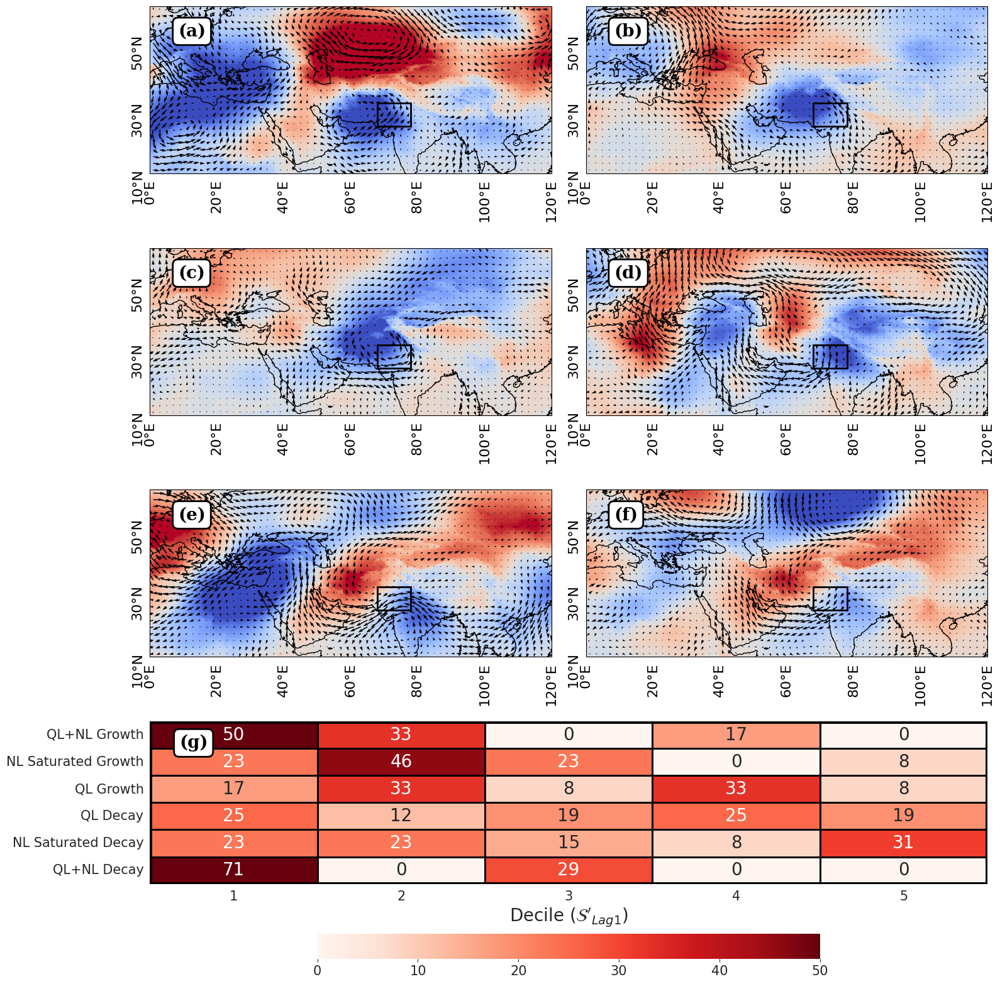

In [119]:
import matplotlib.gridspec as gridspec
files_final = [s for s in files if s not in [
    'Apr_negbg_decay_ql_xy_z_v2.csv',
'Apr_negbg_decay_ql_xy_v2.csv', 
'Apr_negbg2_decay_nl_xyz_v2.csv']]

props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='k', linewidth=2)
border_thickness = 5
plt.rcParams['axes.titlesize'] = 15

nrow = round(len(files_final)/2)+1
ncol = 2

fig = plt.figure(figsize = (16,nrow*4))
gs = gridspec.GridSpec(nrow, ncol, 
                      width_ratios=[1,1,], height_ratios=[1,1,1, 1/.75])

ax = [
    [fig.add_subplot(gs[0, 0], projection= ccrs.PlateCarree()), fig.add_subplot(gs[0, 1], projection= ccrs.PlateCarree())],
    [fig.add_subplot(gs[1, 0], projection= ccrs.PlateCarree()), fig.add_subplot(gs[1, 1], projection= ccrs.PlateCarree())],
    [fig.add_subplot(gs[2, 0], projection= ccrs.PlateCarree()), fig.add_subplot(gs[2, 1], projection= ccrs.PlateCarree())], 
    [fig.add_subplot(gs[3, :])], 
]

importlib.reload(composite_funcs)
from composite_funcs import *

k=0
for i in range(len(files_final)):
    for two_day_averaging in [True]:
        file = files_final[i]
        print(i, file)
        
        rowind = bicol_panel_rownum(k)
        colind = bicol_panel_colnum(k)

        df = pd.read_csv(dir_csv + file, parse_dates=['date'])
        print(df.shape)
        
        if two_day_averaging == True:
            nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')]
        else:
            nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

        print('len(nc_lst)', len(nc_lst))
        
    
        if 'Net_Adv' not in df.columns:
            df['Net_Adv'] = df['adv_recon_2Dave'].copy()

        os.chdir(dir_data)
        def preprocess(ds):
            return ds.expand_dims('date')

        ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
        print('ds_brnch', ds_brnch.dims)

        flux_dts = df.date.to_list()
        print(len(flux_dts))

        #########################################
    #     plot composites once
        u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()

        plot_composite_final_plot(
            da_plt = da_plt, 
            da_cont = da_cont, 
            cbar_on = False, #if rowind + 1 < nrow else True,
            da_u = da_u, 
            da_v =da_v, 
            axi = ax[rowind][colind],
            xmin=da_plt.longitude.values.min().astype('int'), 
            xmax=da_plt.longitude.values.max().astype('int'), 
            ymin=da_plt.latitude.values.min().astype('int'), 
            ymax=da_plt.latitude.values.max().astype('int'), 
            vmin_in = -4000, vmax_in = 4000,
            contours='off', 
            cbar_pad= 0.1 if rowind + 1 < nrow else 0.3,
            cont_divisions=20, coarsen_pts=8,
            t_type = 'dse_anom', scale_quiv= 200, 
            latlon_ticksz=16, 
            latlon_tickcol = 'black',
#             title_str = file + ', ' + str(df.shape[0])
        #   title_str = 'dse_flx = {}, date = {}'.format(tot_flx, str(df.date.iloc[i].date()))
        )
        
        k = k+1
        gc.collect()
        gc.collect()

# cbar_ax = fig.add_axes([0.91, 0.15, 0.03, 0.7])
# cbar = fig.colorbar(ax[0, 0].get_images()[0], cax=cbar_ax)
# cbar.set_label('$\mathcal{S}\'$ (J kg$^{-1}$)')

fontname = 'DejaVu Serif'
props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='k', linewidth=2)
k=0
for rowind in range(3):
    for colind in range(2):
        ax[rowind][colind].text(.07, .9, '({})'.format(chr(97+k)), transform=ax[rowind][colind].transAxes, 
                                fontsize=20, fontname =fontname, 
                      verticalalignment='top', c='k', bbox=props, fontweight='bold')

        if (rowind!=nrow-1) or (colind==0):
            current_ax = ax[rowind][colind]
            current_ax.spines["top"].set_linewidth(border_thickness)
            current_ax.spines["right"].set_linewidth(border_thickness)
            current_ax.spines["bottom"].set_linewidth(border_thickness)
            current_ax.spines["left"].set_linewidth(border_thickness)
            # Optional: Customize border color
            for spine in current_ax.spines.values():
                spine.set_color("black")

        k+=1


%store -r pivoted_df_apr_negbg

# Plot the heatmap
sns.heatmap(
    pivoted_df_apr_negbg.iloc[[2,0,1,4,3,5],:].rename(
    index={
        'amplif_NLSat_main': 'NL Saturated Growth', 
        'amplif_QL_main': 'QL Growth', 
        'amplif_full_main': 'QL+NL Growth',
        'decay_NLSat_main': 'NL Saturated Decay',
        'decay_QL2_main': 'QL Decay', 
        "decay_full_main": 'QL+NL Decay'}), 
    annot=True, cmap='Reds', vmin=0, vmax=50, linewidths=1, linecolor='k',
    ax=ax[3][0],
    cbar_kws={'orientation': 'horizontal', 'pad':0.2, 'shrink':0.6},
    annot_kws={"fontsize": 20},
)

ax[3][0].set_xlabel('Decile ($\mathcal{S}\'_{Lag1})$')
plt.ylabel('')
labels = range(1, 6)
border_thickness = 5
ax[3][0].set_xticklabels(labels) # , rotation=0, horizontalalignment='right'
ax[3][0].add_patch(
    plt.Rectangle((0, 0), pivoted_df_apr_negbg.shape[1], pivoted_df_apr_negbg.shape[0], 
    edgecolor='black', fill=False, lw=border_thickness, 
    transform=ax[3][0].transData)
)

ax[3][0].text(
    .035, .92, '(g)', transform=ax[3][0].transAxes, 
    fontsize=20, fontname =fontname, 
    verticalalignment='top', c='k', bbox=props, fontweight='bold'
)

# fig.delaxes(ax[2][1])  # Adjust index for the empty subplot
fig.patch.set_facecolor('white')  # Background color

plt.tight_layout()

plt.savefig('/home/data/lab_hardik/Manuscript1/Fig_Apr_regimes_negbg_htmap.pdf', bbox_inches='tight')


In [96]:
files_final

['Apr_negbg2_amplif_full_xyNL_v2.csv',
 'Apr_negbg_amplif_nlsat_yNL_v2.csv',
 'Apr_negbg_amplif_ql_xy_v2.csv',
 'Apr_negbg_decay_full_yzNL_v2.csv',
 'Apr_negbg2_decay_nlsat_xNL_v2.csv',
 'Apr_negbg2_decay_ql_xy_v2.csv']

In [62]:
files

['Apr_negbg2_amplif_full_xyNL_v2.csv',
 'Apr_negbg_amplif_nlsat_yNL_v2.csv',
 'Apr_negbg_amplif_ql_xy_v2.csv',
 'Apr_negbg_decay_full_yzNL_v2.csv',
 'Apr_negbg2_decay_nl_xyz_v2.csv',
 'Apr_negbg2_decay_nlsat_xNL_v2.csv',
 'Apr_negbg_decay_ql_xy_z_v2.csv',
 'Apr_negbg_decay_ql_xy_v2.csv',
 'Apr_negbg2_decay_ql_xy_v2.csv']

Dont't use: 
'Apr_negbg_decay_ql_xy_z_v2.csv',
'Apr_negbg_decay_ql_xy_v2.csv', 
'Apr_negbg2_decay_nl_xyz_v2.csv'